In [1]:
from IPython.core.interactiveshell import InteractiveShell
import numpy as np
import pandas as pd
import warnings
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import DataPreProcessor as DPP

warnings.filterwarnings('ignore')
InteractiveShell.ast_node_interactivity = "all"

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)
pd.options.display.max_rows


# 1. Load data


In [2]:
chotot_df = pd.read_csv("chotot_cleaned.csv")


In [3]:
alonhadat_df = pd.read_csv("alonhadat.csv")


In [4]:
chotot_df.drop(columns=['address', 'type_real_estate'], inplace=True)
chotot_df.rename(columns={'ahl_type': 'type_details'}, inplace=True)
chotot_df['website'] = 'Chotot'
chotot_df['front_road'] = np.nan
chotot_df.head(3)


,list_time,ward,area,region,property_status,direction,balconydirection,property_legal_document,size (m2),floornumber,furnishing_sell,rooms,toilets,floors,living_size (m2),width (m),length (m),price (million),type_details,website,front_road
0,05/11/2021,Phường Tam Hòa,Thành phố Biên Hòa,Đồng Nai,Đã bàn giao,NaN,NaN,Đang chờ sổ,70.0,NaN,NaN,2,2,Nhiều hơn 10,NaN,NaN,NaN,1150.0,Chung cư,Chotot,NaN
1,05/11/2021,Phường Thống Nhất,Thành phố Biên Hòa,Đồng Nai,Đã bàn giao,Bắc,Nam,Đã có sổ,48.0,NaN,Nội thất đầy đủ,1,1,Nhiều hơn 10,NaN,NaN,NaN,1550.0,Chung cư,Chotot,NaN
2,05/11/2021,Phường Hố Nai,Thành phố Biên Hòa,Đồng Nai,Chưa bàn giao,NaN,NaN,Giấy tờ khác,67.0,NaN,Hoàn thiện cơ bản,2,2,Nhiều hơn 10,NaN,NaN,NaN,360.0,Chung cư,Chotot,NaN


In [5]:
alonhadat_df['website'] = 'alonhadat'
alonhadat_df.head(3)


,city,date,direction,district,floors,front_road,length,price (million),property_legal_document,rooms,size,type_real_estate,ward,width,website
0,Bình Dương,08/11/2021,NaN,Thành phố Thủ Dầu Một,2.0,12.0,12.0,3200.0,NaN,3.0,120.0,Nhà mặt tiền,Phường Hiệp An,6.0,alonhadat
1,Bình Dương,08/11/2021,NaN,Thành phố Thuận An,NaN,10.0,70.0,32000.0,Sổ hồng/ Sổ đỏ,NaN,900.0,Nhà mặt tiền,Phường An Phú,17.0,alonhadat
2,Bình Dương,08/11/2021,NaN,Thành phố Dĩ An,1.0,4.0,12.0,2550.0,Sổ hồng/ Sổ đỏ,3.0,60.0,Nhà trong hẻm,Phường Đông Hòa,5.0,alonhadat


In [6]:
agreement_df = alonhadat_df[alonhadat_df['price (million)'] == "Thỏa thuận"].copy(
)


In [7]:
agreement_df.head()


,city,date,direction,district,floors,front_road,length,price (million),property_legal_document,rooms,size,type_real_estate,ward,width,website
1401,Bình Dương,28/10/2021,NaN,Huyện Bắc Tân Uyên,NaN,10.0,150.0,Thỏa thuận,Sổ hồng/ Sổ đỏ,NaN,15800.0,"Kho, xưởng",Xã Đất Cuốc,100.0,alonhadat
2777,Bình Dương,05/11/2021,Đông Nam,Thành phố Thuận An,NaN,16.0,30.0,Thỏa thuận,Sổ hồng/ Sổ đỏ,NaN,450.0,"Đất nền, liền kề, đất dự án",Phường Thuận Giao,15.0,alonhadat
2964,Bình Dương,06/11/2021,NaN,Thị xã Tân Uyên,NaN,NaN,NaN,Thỏa thuận,NaN,NaN,140000.0,"Kho, xưởng",Phường Khánh Bình,NaN,alonhadat
3758,Bình Dương,07/11/2021,NaN,Thị xã Tân Uyên,NaN,8.0,100.0,Thỏa thuận,Sổ hồng/ Sổ đỏ,NaN,22000.0,"Kho, xưởng",Xã Vĩnh Tân,100.0,alonhadat
3779,Bình Dương,07/11/2021,Tây,Huyện Bắc Tân Uyên,NaN,18.0,130.0,Thỏa thuận,NaN,NaN,15800.0,"Kho, xưởng",Xã Đất Cuốc,120.0,alonhadat


In [8]:
alonhadat_df = alonhadat_df[alonhadat_df['price (million)'] != "Thỏa thuận"].reset_index(
    drop=True)


# 2. Merge Data


In [9]:
alonhadat_df.columns


Index(['city', 'date', 'direction', 'district', 'floors', 'front_road',
       'length', 'price (million)', 'property_legal_document', 'rooms', 'size',
       'type_real_estate', 'ward', 'width', 'website'],
      dtype='object')

In [10]:
chotot_df.columns


Index(['list_time', 'ward', 'area', 'region', 'property_status', 'direction',
       'balconydirection', 'property_legal_document', 'size (m2)',
       'floornumber', 'furnishing_sell', 'rooms', 'toilets', 'floors',
       'living_size (m2)', 'width (m)', 'length (m)', 'price (million)',
       'type_details', 'website', 'front_road'],
      dtype='object')

In [11]:
alonhadat_df.columns.difference(chotot_df.columns)


Index(['city', 'date', 'district', 'length', 'size', 'type_real_estate',
       'width'],
      dtype='object')

In [12]:
alonhadat_df.rename(columns={"city": "region", "date": "list_time", "size": "size (m2)",
                             "type_real_estate": "type_details", "district": "area",
                             "length": "length (m)", "width": "width (m)"}, inplace=True)


In [13]:
# merge 2 data lai thanh BDS_df
BDS_df = pd.concat([chotot_df, alonhadat_df], ignore_index=True)
BDS_df.drop_duplicates(inplace=True)


In [14]:
# Chuyển price về dạng float
BDS_df['price (million)'] = BDS_df['price (million)'].astype('float')


In [15]:
BDS_df.shape
BDS_df.sample(5)


(215737, 21)

,list_time,ward,area,region,property_status,direction,balconydirection,property_legal_document,size (m2),floornumber,furnishing_sell,rooms,toilets,floors,living_size (m2),width (m),length (m),price (million),type_details,website,front_road
132022,01/11/2021,Phường 15,Quận Tân Bình,Hồ Chí Minh,NaN,NaN,NaN,Sổ hồng/ Sổ đỏ,66.0,NaN,NaN,6.0,NaN,5.0,NaN,4.0,17.0,6500.0,Nhà trong hẻm,alonhadat,8.0
76229,01/10/2021,Phường Bình Hưng Hoà B,Quận Bình Tân,Tp Hồ Chí Minh,NaN,NaN,NaN,Đã có sổ,52.0,NaN,NaN,4,4,4,52.0,4.0,13.0,4600.0,Nhà ngõ,Chotot,NaN
199150,07/11/2021,Phường 13,Quận Tân Bình,Hồ Chí Minh,NaN,NaN,NaN,NaN,60.0,NaN,NaN,4.0,NaN,4.0,NaN,NaN,NaN,9000.0,Nhà trong hẻm,alonhadat,4.0
160081,05/11/2021,Phường 11,Quận Bình Thạnh,Hồ Chí Minh,NaN,NaN,NaN,Sổ hồng/ Sổ đỏ,102.0,NaN,NaN,5.0,NaN,5.0,NaN,4.5,19.0,10000.0,Nhà trong hẻm,alonhadat,6.0
125903,30/10/2021,Phường 22,Quận Bình Thạnh,Hồ Chí Minh,NaN,Tây Nam,NaN,Sổ hồng/ Sổ đỏ,379.0,NaN,NaN,NaN,NaN,NaN,NaN,12.0,30.0,130000.0,Nhà mặt tiền,alonhadat,30.0


In [16]:
BDS_numeric = BDS_df.copy()


In [17]:
BDS_df.columns

Index(['list_time', 'ward', 'area', 'region', 'property_status', 'direction',
       'balconydirection', 'property_legal_document', 'size (m2)',
       'floornumber', 'furnishing_sell', 'rooms', 'toilets', 'floors',
       'living_size (m2)', 'width (m)', 'length (m)', 'price (million)',
       'type_details', 'website', 'front_road'],
      dtype='object')

In [18]:
BDS_numeric = BDS_numeric[['width (m)','length (m)','living_size (m2)', 'size (m2)','price (million)']]


In [19]:
BDS_numeric.dropna(inplace=True)

In [20]:
mark = BDS_numeric['price (million)'].quantile(0.99)
mark

40000.0

In [21]:
BDS_numeric = BDS_numeric[BDS_numeric['price (million)']<=mark]

In [22]:
p1 = DPP.DataPreProcessor(BDS_numeric)
p1.convert_unit("price (million)", 1000)
BDS_numeric.rename(columns={'price (million)': 'price (billion)'}, inplace=True)

<AxesSubplot:>

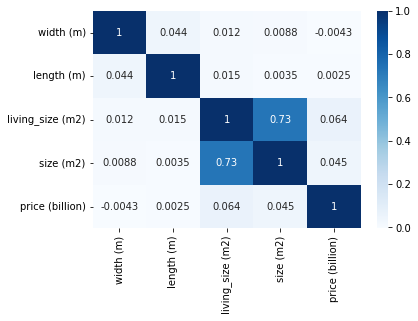

In [23]:
sns.heatmap(data=BDS_numeric.corr(), annot=True, cmap='Blues')


# 3. EDA


## 3.0 Repreprocessing


In [24]:
BDS_df.columns


Index(['list_time', 'ward', 'area', 'region', 'property_status', 'direction',
       'balconydirection', 'property_legal_document', 'size (m2)',
       'floornumber', 'furnishing_sell', 'rooms', 'toilets', 'floors',
       'living_size (m2)', 'width (m)', 'length (m)', 'price (million)',
       'type_details', 'website', 'front_road'],
      dtype='object')

                            ratio                  feature
feature                                                   
list_time                0.000000                list_time
region                   0.000000                   region
price (billion)          0.000000          price (billion)
website                  0.000000                  website
area                     0.000009                     area
type_details             0.000023             type_details
ward                     0.000445                     ward
size (m2)                0.000737                size (m2)
width (m)                0.205199                width (m)
property_legal_document  0.208374  property_legal_document
length (m)               0.223332               length (m)
floors                   0.227114                   floors
rooms                    0.228918                    rooms
front_road               0.450451               front_road
toilets                  0.699101                  toile

<Figure size 720x720 with 0 Axes>

<AxesSubplot:xlabel='ratio', ylabel='feature'>

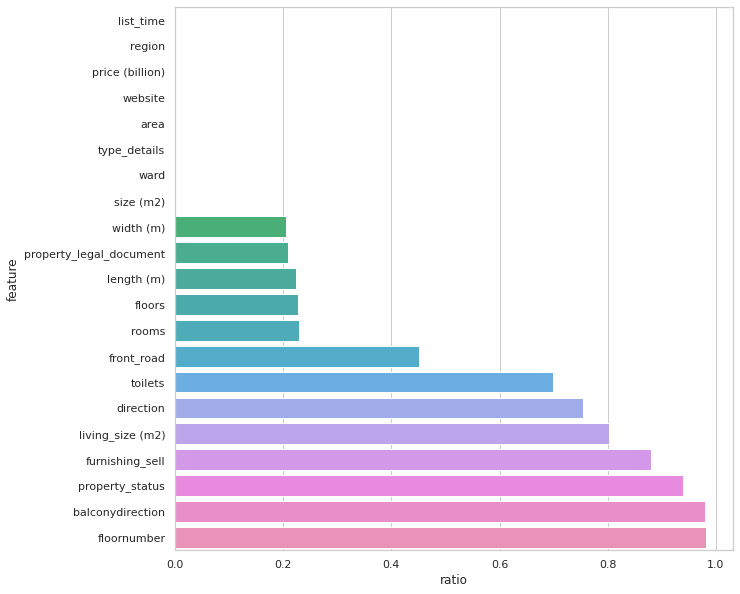

In [25]:
p = DPP.DataPreProcessor(BDS_df)
p.convert_unit("price (million)", 1000)
BDS_df.rename(columns={'price (million)': 'price (billion)'}, inplace=True)
missing_df = p.cal_ratio_missing_data(BDS_df.columns)
print(missing_df)
plt.figure(figsize=(10, 10))
sns.set(style="whitegrid", color_codes=False)
sns.barplot(y='feature', x='ratio', data=missing_df, orient='h')
plt.show()


In [26]:
BDS_df1 = BDS_df.copy()


### price


In [27]:
BDS_df1['price (billion)'].describe()


count    2.157370e+05
mean     8.090612e+03
std      3.751127e+06
min      3.700000e-04
25%      2.740000e+00
50%      5.300000e+00
75%      1.100000e+01
max      1.742304e+09
Name: price (billion), dtype: float64

In [28]:
BDS_df1[BDS_df1['price (billion)'] == max(BDS_df1['price (billion)'])]

,list_time,ward,area,region,property_status,direction,balconydirection,property_legal_document,size (m2),floornumber,furnishing_sell,rooms,toilets,floors,living_size (m2),width (m),length (m),price (billion),type_details,website,front_road
47178,01/11/2021,Phường 15,Quận Tân Bình,Tp Hồ Chí Minh,NaN,NaN,NaN,Đã có sổ,56.0,NaN,NaN,2,1,Nhiều hơn 10,56.0,4.0,14.0,1.742304e+09,Nhà ngõ,Chotot,NaN


In [29]:
BDS_df1[~(BDS_df1['price (billion)'] != max(BDS_df1['price (billion)']))].reset_index(drop=True, inplace=True)


In [30]:
price_mark = BDS_df1['price (billion)'].quantile(0.99)
price_mark


160.0

In [31]:
BDS_df1[BDS_df1['price (billion)'] > price_mark].describe(include='all')

,list_time,ward,area,region,property_status,direction,balconydirection,property_legal_document,size (m2),floornumber,furnishing_sell,rooms,toilets,floors,living_size (m2),width (m),length (m),price (billion),type_details,website,front_road
count,2085,2083,2085,2085,3,153,1,1030,2.085000e+03,2.000000,18,1555.0,77,1607.0,51.000000,1514.000000,1484.000000,2.085000e+03,2085,2085,1870.000000
unique,67,175,42,4,2,8,1,5,NaN,NaN,3,110.0,7,33.0,NaN,NaN,NaN,NaN,22,2,NaN
top,07/11/2021,Phường Bến Thành,Quận 1,Hồ Chí Minh,Đã bàn giao,Đông Nam,Đông Nam,Sổ hồng/ Sổ đỏ,NaN,NaN,Nội thất cao cấp,1.0,Nhiều hơn 6,1.0,NaN,NaN,NaN,NaN,Nhà mặt tiền,alonhadat,NaN
freq,639,324,767,1876,2,45,1,853,NaN,NaN,10,246.0,21,316.0,NaN,NaN,NaN,NaN,1321,1935,NaN
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.102269e+04,13.500000,NaN,NaN,NaN,NaN,1582.705882,32.979551,58.518834,8.360121e+05,NaN,NaN,33.492727
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.194844e+06,13.435029,NaN,NaN,NaN,NaN,3496.144970,134.574135,293.735396,3.815671e+07,NaN,NaN,88.793615
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.500000e+01,4.000000,NaN,NaN,NaN,NaN,45.000000,0.000000,0.000000,1.600500e+02,NaN,NaN,0.000000
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.430000e+02,8.750000,NaN,NaN,NaN,NaN,140.500000,12.000000,24.000000,1.990000e+02,NaN,NaN,20.000000
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.470000e+02,13.500000,NaN,NaN,NaN,NaN,308.000000,18.000000,31.000000,2.600000e+02,NaN,NaN,20.000000
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.500000e+03,18.250000,NaN,NaN,NaN,NaN,1180.500000,25.000000,46.000000,3.800000e+02,NaN,NaN,30.000000


### _floor number_ (Cần thu thập thêm) => Loại


In [32]:
BDS_df1['floornumber'].unique()


array([ nan,  16.,   7.,   4.,  12.,   1.,  14.,  18.,  11.,  10.,   9.,
         3.,  29.,   2.,  15.,  22.,  21.,   8.,  19.,   6.,  20.,  35.,
        23.,  27.,  28.,   5.,  25.,  24.,  34.,  13.,  30.,  17.,  26.,
        40.,  37.,  36.,  32.,  33.,  38.,  47.,  39.,  31.,  41.,  45.,
       456.,  48., 320., 132.,  44.])

In [33]:
BDS_df1['floornumber'] = BDS_df1['floornumber'].apply(
    DPP.convertNum2Int, convert_dtype=False)


<Figure size 720x720 with 0 Axes>

<AxesSubplot:xlabel='price (billion)', ylabel='floornumber'>

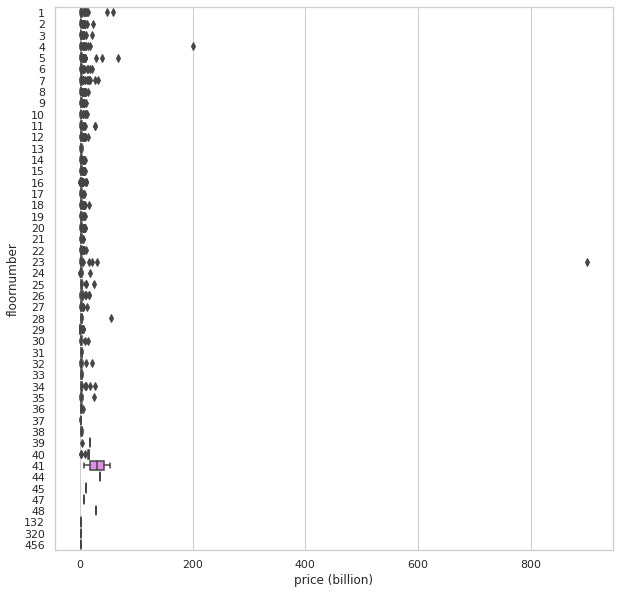

In [34]:
plt.figure(figsize=(10, 10))
sns.boxplot(data=BDS_df1,
            y="floornumber", x='price (billion)', orient='h')


In [35]:
# Loại giá trị không hợp lý
BDS_df1 = BDS_df1[~((BDS_df1['price (billion)'] > 800) & (BDS_df1['size (m2)'] <= 100))]


In [36]:
# Loại giá trị không hợp lý
BDS_df1=BDS_df1[~((BDS_df1['price (billion)'] > 175) & (BDS_df1['floornumber'] < 10))]


In [37]:
# Loại bỏ giá trị tầng sô không tồn tại thực tế
BDS_df1[~(BDS_df1['floornumber'] >= 81)].reset_index(drop=True, inplace=True)


### _balcony direction_ (Loại)


In [38]:
BDS_df1['balconydirection'].unique()


array([nan, 'Nam', 'Đông Nam', 'Tây', 'Đông', 'Tây Nam', 'Tây Bắc', 'Bắc',
       'Đông Bắc'], dtype=object)

<Figure size 1800x720 with 0 Axes>

<AxesSubplot:xlabel='price (billion)', ylabel='balconydirection'>

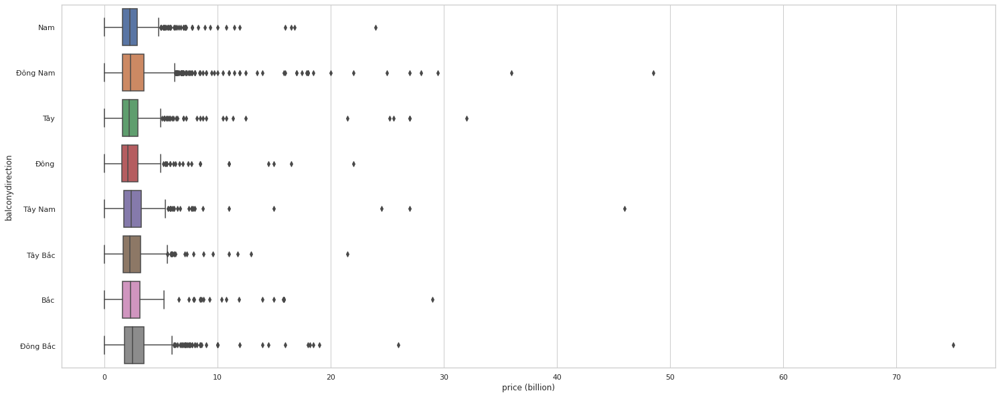

In [39]:
plt.figure(figsize=(25, 10))
sns.boxplot(data=BDS_df1,
            y="balconydirection", x='price (billion)', orient='h')


In [40]:
BDS_df1[(BDS_df1['price (billion)'] > 40)][pd.notnull(BDS_df1["balconydirection"])]


,list_time,ward,area,region,property_status,direction,balconydirection,property_legal_document,size (m2),floornumber,furnishing_sell,rooms,toilets,floors,living_size (m2),width (m),length (m),price (billion),type_details,website,front_road
22953,04/11/2021,Phường 22,Quận Bình Thạnh,Tp Hồ Chí Minh,Đã bàn giao,Đông Bắc,Đông Bắc,Đã có sổ,147.0,NaN,Nội thất cao cấp,4,3,Nhiều hơn 10,NaN,NaN,NaN,75.0,Chung cư,Chotot,NaN
23197,04/11/2021,Phường Phú Hữu,Quận 9,Tp Hồ Chí Minh,Đã bàn giao,Tây Nam,Tây Nam,Đã có sổ,312.4,NaN,Bàn giao thô,2,3,Nhiều hơn 10,NaN,NaN,NaN,46.0,Căn hộ dịch vụ,Chotot,NaN
27952,20/10/2021,Phường Sơn Kỳ,Quận Tân Phú,Tp Hồ Chí Minh,Đã bàn giao,Đông Nam,Đông Nam,Đã có sổ,84.0,1,NaN,3,2,Nhiều hơn 10,NaN,NaN,NaN,48.5,Chung cư,Chotot,NaN


### _property status_ (Loại)


In [41]:
BDS_df1['property_status'].unique()


array(['Đã bàn giao', 'Chưa bàn giao', nan], dtype=object)

<Figure size 504x720 with 0 Axes>

<AxesSubplot:xlabel='property_status', ylabel='price (billion)'>

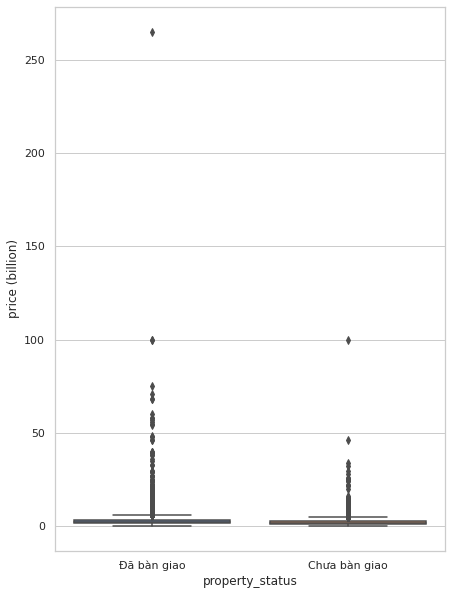

In [42]:
plt.figure(figsize=(7, 10))
sns.boxplot(data=BDS_df1, x="property_status", y="price (billion)")


### _furnishing_sell_ (Cần thu thập thêm) => Loại


In [43]:
BDS_df1["furnishing_sell"].unique()


array([nan, 'Nội thất đầy đủ', 'Hoàn thiện cơ bản', 'Bàn giao thô',
       'Nội thất cao cấp'], dtype=object)

<Figure size 504x720 with 0 Axes>

<AxesSubplot:xlabel='furnishing_sell', ylabel='price (billion)'>

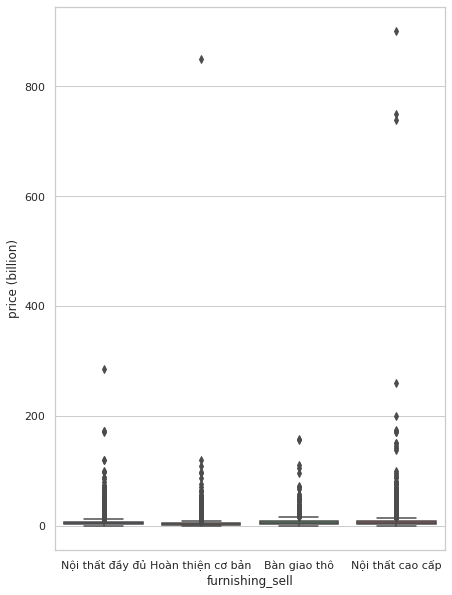

In [44]:
plt.figure(figsize=(7, 10))
sns.boxplot(data=BDS_df1, x="furnishing_sell", y="price (billion)")


### type_details


In [45]:
BDS_df1['type_details'].unique()


array(['Chung cư', 'Căn hộ dịch vụ', 'Duplex', 'Penthouse', 'Nhà mặt phố',
       'Nhà ngõ', 'Nhà phố liền kề', 'Nhà biệt thự', 'Đất thổ cư',
       'Đất nông nghiệp', 'Đất công nghiệp', 'Đất nền dự án', 'Tập thể',
       'Officetel', nan, 'Nhà mặt tiền', 'Nhà trong hẻm',
       'Đất thổ cư, đất ở', 'Căn hộ chung cư',
       'Đất nền, liền kề, đất dự án', 'Biệt thự, nhà liền kề',
       'Nhà hàng, khách sạn', 'Phòng trọ, nhà trọ', 'Kho, xưởng',
       'Đất nông, lâm nghiệp', 'Shop, kiot, quán', 'Mặt bằng',
       'Văn phòng', 'Trang trại', 'Các loại khác'], dtype=object)

<Figure size 1440x720 with 0 Axes>

<AxesSubplot:xlabel='price (billion)', ylabel='type_details'>

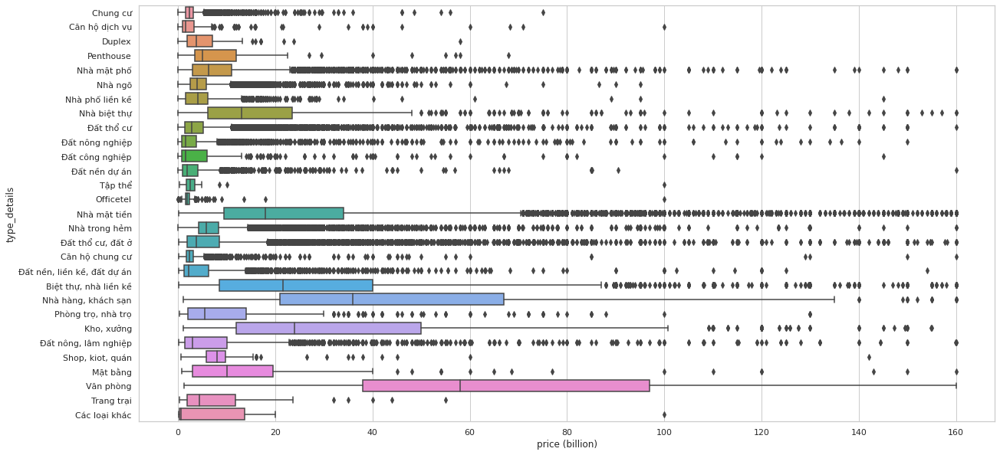

In [46]:
plt.figure(figsize=(20, 10))
sns.boxplot(data=BDS_df1[BDS_df1['price (billion)'] <= price_mark],
            x="price (billion)", y="type_details", orient='h')


In [47]:
def group_value_type_real_estate(x):
    if x is np.nan:
        return x
    type_real_estate = {'Căn hộ/Chung cư': ['Chung cư',
                                            'Tập thể',
                                            'Officetel',
                                            'Căn hộ dịch vụ',
                                            'Duplex',
                                            'Penthouse',
                                            'Căn hộ chung cư'],
                        'Nhà ở': ['Nhà mặt phố',
                                  'Nhà ngõ',
                                  'Nhà phố liền kề',
                                  'Nhà biệt thự',
                                  'Nhà mặt tiền',
                                  'Nhà trong hẻm',
                                  'Biệt thự, nhà liền kề'],
                        'Đất': ['Đất thổ cư',
                                'Đất nông nghiệp',
                                'Đất công nghiệp',
                                'Đất nền dự án',
                                'Đất thổ cư, đất ở',
                                'Đất nền, liền kề, đất dự án',
                                'Đất nông, lâm nghiệp'],
                        'Khác': ['Nhà hàng, khách sạn',
                                 'Phòng trọ, nhà trọ',
                                 'Kho, xưởng',
                                 'Shop, kiot, quán',
                                 'Mặt bằng',
                                 'Văn phòng',
                                 'Trang trại',
                                 'Các loại khác']}
    for key, value in type_real_estate.items():
        if x in value:
            return key
    return x


In [48]:
BDS_df1["type_real_estate"] = BDS_df1["type_details"].apply(
    group_value_type_real_estate)


In [49]:
BDS_df1["type_details"].replace({'Chung cư': 'Căn hộ chung cư',
                                'Nhà trong hẻm': 'Nhà ngõ',
                                 'Đất thổ cư, đất ở': 'Đất thổ cư',
                                 'Đất nền, liền kề, đất dự án': 'Đất nền dự án',
                                 'Đất nông nghiệp': 'Đất nông, lâm nghiệp',
                                 'Nhà mặt phố': 'Nhà mặt tiền',
                                 'Nhà biệt thự': 'Biệt thự, nhà liền kề',
                                 'Nhà phố liền kề': 'Biệt thự, nhà liền kề'}, inplace=True)


<Figure size 1080x504 with 0 Axes>

<AxesSubplot:xlabel='price (billion)', ylabel='type_real_estate'>

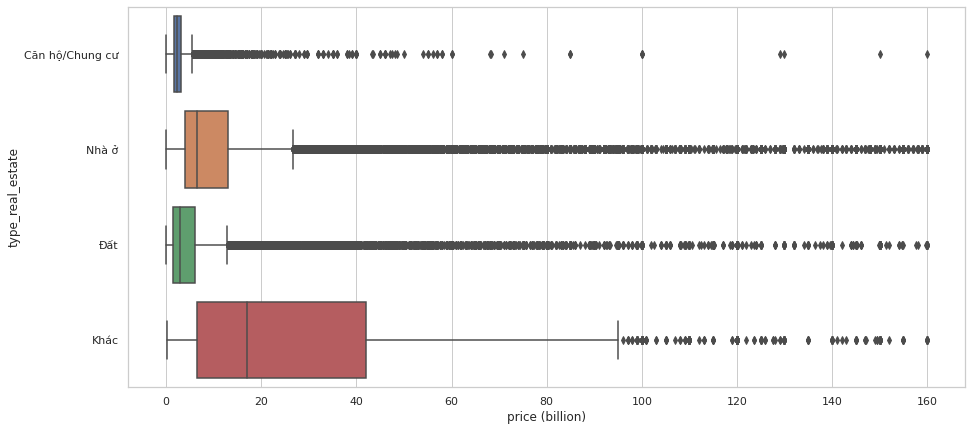

In [50]:
plt.figure(figsize=(15, 7))
sns.boxplot(data=BDS_df1[BDS_df1['price (billion)'] <= price_mark],
            x="price (billion)", y="type_real_estate", orient='h')


### length, width, size


In [51]:
BDS_df1['length (m)'] = BDS_df1['length (m)'].apply(
    lambda x: np.nan if x == 0 else x)
BDS_df1['width (m)'] = BDS_df1['width (m)'].apply(
    lambda x: np.nan if x == 0 else x)


<AxesSubplot:xlabel='length (m)', ylabel='price (billion)'>

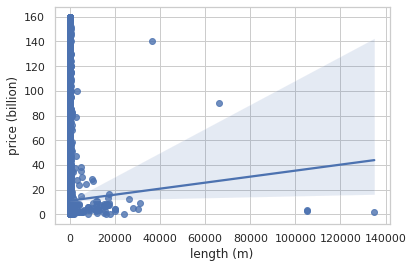

In [52]:
sns.regplot(data=BDS_df1[BDS_df1['price (billion)'] <=
            price_mark], x="length (m)", y="price (billion)")


In [53]:
BDS_df1['length (m)'].describe()


count    167160.000000
mean         30.307550
std         594.900765
min           0.580000
25%          12.500000
50%          17.000000
75%          22.000000
max      135000.000000
Name: length (m), dtype: float64

In [54]:
BDS_df1['length (m)'].quantile(0.99)


120.0

In [55]:
len(BDS_df1[BDS_df1['length (m)'] >= BDS_df1['length (m)'].quantile(0.99)]), len(BDS_df1)


(1782, 215722)

In [56]:
BDS_df1[~(BDS_df1['length (m)'] >=
           BDS_df1['length (m)'].quantile(0.99))].reset_index(drop=True, inplace=True)


<AxesSubplot:xlabel='width (m)', ylabel='price (billion)'>

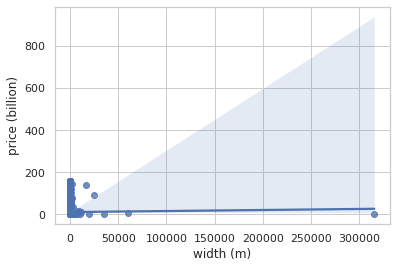

In [57]:
sns.regplot(data=BDS_df1[BDS_df1['price (billion)'] <=
                         price_mark], x="width (m)", y="price (billion)")


<AxesSubplot:xlabel='length (m)', ylabel='price (billion)'>

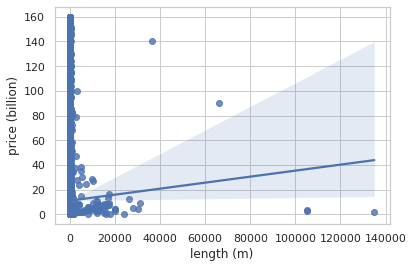

In [58]:
sns.regplot(data=BDS_df1[BDS_df1['price (billion)'] <=
            price_mark], x="length (m)", y="price (billion)")


In [59]:
BDS_df1['width (m)'].describe()


count    171081.000000
mean         13.903800
std         793.145628
min           0.130000
25%           4.000000
50%           5.000000
75%           6.500000
max      315375.000000
Name: width (m), dtype: float64

In [60]:
BDS_df1[BDS_df1['width (m)'] == 315375]


,list_time,ward,area,region,property_status,direction,balconydirection,property_legal_document,size (m2),floornumber,furnishing_sell,rooms,toilets,floors,living_size (m2),width (m),length (m),price (billion),type_details,website,front_road,type_real_estate
65598,18/10/2021,Phường An Lạc A,Quận Bình Tân,Tp Hồ Chí Minh,NaN,Tây,NaN,Đã có sổ,83.0,NaN,Hoàn thiện cơ bản,Nhiều hơn 10,Nhiều hơn 6,4,229.0,315375.0,26.0,0.16,Nhà mặt tiền,Chotot,NaN,Nhà ở


In [61]:
BDS_df1['width (m)'].quantile(0.99)


74.0

In [62]:
len(BDS_df1[BDS_df1['width (m)'] >= BDS_df1['width (m)'].quantile(0.99)]), len(BDS_df1)


(1712, 215722)

In [63]:
BDS_df1 = BDS_df1[~(BDS_df1['width (m)'] >= BDS_df1['width (m)'].quantile(0.99))].reset_index(drop=True)


In [64]:
# Xử lý các giá trị NaN tại size và living size
for i in range(len(BDS_df1)):
    # Nếu size = NaN và living_size != NaN thì gán size = living_size
    if (np.isnan(BDS_df1.loc[i, "size (m2)"])) & (not np.isnan(BDS_df1.loc[i, "living_size (m2)"])):
        BDS_df1.at[i, "size (m2)"] = BDS_df1.loc[i,
                                                 "living_size (m2)"]
    # Nếu size = NaN và living_size = NaN thì gán size = length*width
    elif np.isnan(BDS_df1.loc[i, "size (m2)"]) & (np.isnan(BDS_df1.loc[i, "living_size (m2)"])):
        BDS_df1.at[i, "size (m2)"] = BDS_df1.loc[i,
                                                 "length (m)"]*BDS_df1.loc[i, "width (m)"]

    if np.isnan(BDS_df1.loc[i, "living_size (m2)"]):
        if not np.isnan(BDS_df1.loc[i, "size (m2)"]):
            if str(BDS_df1.loc[i, "floors"]) != 'nan':
                # Nếu floors != NaN thì living_size = size*floors
                # Nếu floors == Nhiều hơn 10 thì living_size = size*10
                try:
                    BDS_df1.at[i, "living_size (m2)"] = BDS_df1.loc[i,
                                                                    "size (m2)"]*BDS_df1.loc[i, "floors"]
                except:
                    BDS_df1.at[i,
                               "living_size (m2)"] = BDS_df1.loc[i, "size (m2)"]*10
            else:
                # Nếu floors == NaN thì living_size = size
                BDS_df1.at[i, "living_size (m2)"] = BDS_df1.loc[i,
                                                                "size (m2)"]


In [65]:
# Xử lý NaN length và width
for i in range(len(BDS_df1)):
    if not np.isnan(BDS_df1.loc[i, "size (m2)"]):

        if np.isnan(BDS_df1.loc[i, "length (m)"]) & np.isnan(BDS_df1.loc[i, "width (m)"]):
            continue

        elif np.isnan(BDS_df1.loc[i, "length (m)"]):
            BDS_df1.loc[i, "length (m)"] = round(
                BDS_df1.loc[i, "size (m2)"]/BDS_df1.loc[i, "width (m)"], 5)

        elif np.isnan(BDS_df1.loc[i, "width (m)"]):
            BDS_df1.loc[i, "width (m)"] = round(
                BDS_df1.loc[i, "size (m2)"]/BDS_df1.loc[i, "length (m)"], 5)


In [66]:
len(BDS_df1[["length (m)", "width (m)", "floors", "size (m2)", "living_size (m2)"]
            ][(BDS_df1["living_size (m2)"].isna()) | (BDS_df1["living_size (m2)"].isna())]), len(BDS_df1)


(109, 214010)

In [67]:
len(BDS_df1[(BDS_df1["length (m)"].isna()) | (BDS_df1["width (m)"].isna())])


44112

In [68]:
BDS_df1[(BDS_df1["length (m)"].isna()) | (
    BDS_df1["length (m)"].isna())].sample(5)


,list_time,ward,area,region,property_status,direction,balconydirection,property_legal_document,size (m2),floornumber,furnishing_sell,rooms,toilets,floors,living_size (m2),width (m),length (m),price (billion),type_details,website,front_road,type_real_estate
124480,31/10/2021,Phường Phú Hữu,Quận 9,Hồ Chí Minh,NaN,NaN,NaN,Sổ hồng/ Sổ đỏ,3700.0,NaN,NaN,NaN,NaN,NaN,3700.0,NaN,NaN,55.00,"Đất nông, lâm nghiệp",alonhadat,8.0,Đất
61511,21/10/2021,Phường 2,Quận Tân Bình,Tp Hồ Chí Minh,NaN,NaN,NaN,Đã có sổ,25.0,NaN,NaN,2,2,Nhiều hơn 10,42.0,NaN,NaN,3.50,Nhà ngõ,Chotot,NaN,Nhà ở
124633,31/10/2021,Phường 25,Quận Bình Thạnh,Hồ Chí Minh,NaN,NaN,NaN,NaN,80.0,NaN,NaN,4.0,NaN,3.0,240.0,NaN,NaN,12.00,Nhà ngõ,alonhadat,6.0,Nhà ở
158851,05/11/2021,Phường 14,Quận Phú Nhuận,Hồ Chí Minh,NaN,NaN,NaN,NaN,84.0,NaN,NaN,13.0,NaN,6.0,504.0,NaN,NaN,15.00,Nhà ngõ,alonhadat,6.0,Nhà ở
3558,04/11/2021,Xã Phú Tân,Huyện Định Quán,Đồng Nai,NaN,NaN,NaN,Đã có sổ,1007.0,NaN,NaN,NaN,NaN,Nhiều hơn 10,10070.0,NaN,NaN,0.32,Đất thổ cư,Chotot,NaN,Đất


### living size vs size


In [69]:
# plt.figure(figsize=(10, 10))
# ax = sns.lineplot(data=BDS_df1[BDS_df1['price (billion)'] <=
#                                price_mark], y='size (m2)', x="price (billion)", linestyle='-.', label="size")
# sns.lineplot(data=BDS_df1[BDS_df1['price (billion)'] <=
#                           price_mark], y='living_size (m2)', x="price (billion)", linestyle='--', label="living_size", ax=ax)


In [70]:
BDS_df1['living_size (m2)'].describe()


count    2.139010e+05
mean     6.580006e+04
std      2.065347e+07
min      1.000000e+00
25%      1.000000e+02
50%      2.040000e+02
75%      5.500000e+02
max      9.000000e+09
Name: living_size (m2), dtype: float64

In [71]:
BDS_df1.to_csv('data version/BDS_df1_new.csv', index=False)


### direction


In [72]:
BDS_df1.to_csv('data version/BDS_df1_new.csv', index=False)


In [73]:
BDS_df2 = BDS_df1.copy()


In [74]:
BDS_df2["direction"].unique()


array([nan, 'Bắc', 'Đông Bắc', 'Đông Nam', 'Đông', 'Tây Bắc', 'Tây',
       'Nam', 'Tây Nam'], dtype=object)

<Figure size 1080x720 with 0 Axes>

<AxesSubplot:xlabel='direction', ylabel='price (billion)'>

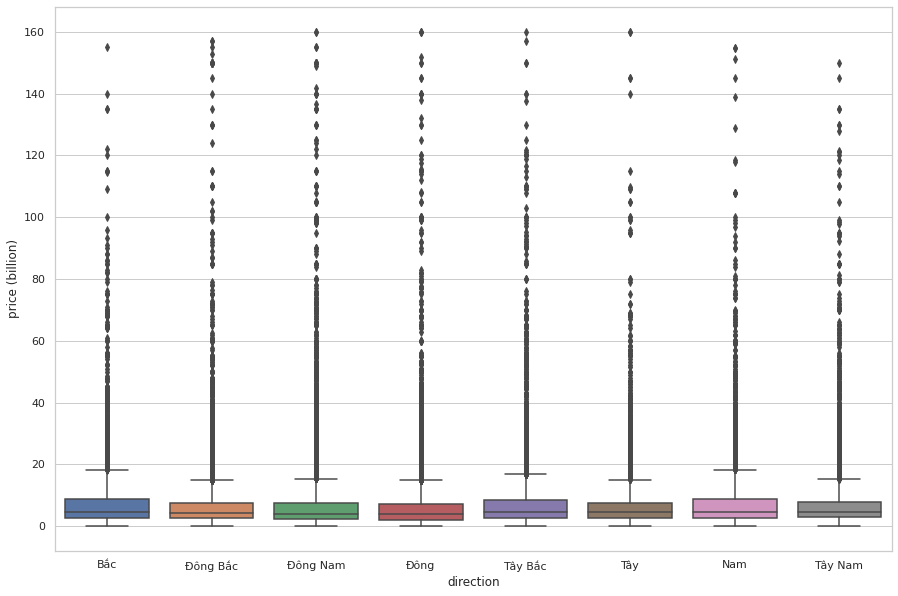

In [75]:
plt.figure(figsize=(15,10))
sns.boxplot(data=BDS_df1[BDS_df1['price (billion)'] <= price_mark],
            x="direction", y="price (billion)")

In [76]:
BDS_df2.to_csv('data version/BDS_df2_new.csv', index=False)


### DF2


In [77]:
BDS_df2 = pd.read_csv('data version/BDS_df2_new.csv')


### toilets


In [78]:
BDS_df3 = BDS_df2.copy()


In [79]:
BDS_df3['toilets'].unique()


array(['2', '1', nan, '5', '3', 'Nhiều hơn 6', '4', '6'], dtype=object)

In [80]:
BDS_df3['toilets'] = BDS_df3['toilets'].apply(
    DPP.convertNum2Int, convert_dtype=False)
# BDS_df3['toilets'] = BDS_df3['toilets'].astype('category')


<Figure size 720x720 with 0 Axes>

<AxesSubplot:xlabel='toilets', ylabel='price (billion)'>

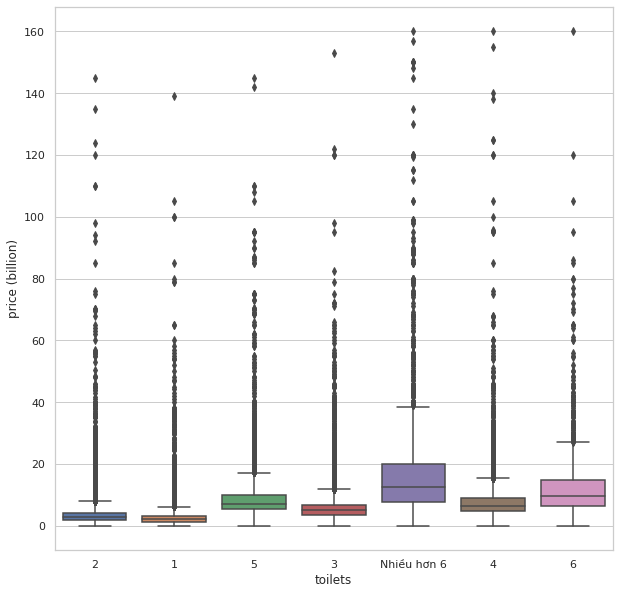

In [81]:
plt.figure(figsize=(10, 10))
sns.boxplot(data=BDS_df3[BDS_df3['price (billion)'] <=
            price_mark], x="toilets", y="price (billion)")


In [82]:
for i in range(BDS_df3.shape[0]):
    if BDS_df3.loc[i,'type_real_estate'] == 'Đất':
        BDS_df3.at[i,'toilets'] = 0

In [83]:
# # plt.figure(figsize=(10, 10))
# fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 10), sharex=True)

# sns.boxplot(data=BDS_df1[BDS_df1['price (billion)'] <= price_mark],
#             x="toilets", y="price (billion)", ax=axes[0])
# axes[0].set_title("Chưa điền giá trị")
# sns.boxplot(data=BDS_df3[BDS_df3['price (billion)'] <= price_mark],
#             x="toilets", y="price (billion)", ax=axes[1])
# axes[1].set_title("Đã điền giá trị")


In [84]:
BDS_df3.to_csv('data version/BDS_df3_new.csv', index=False)


### DF3


In [85]:
BDS_df3 = pd.read_csv('data version/BDS_df3_new.csv')


### front road


In [86]:
BDS_df4 = BDS_df3.copy()


In [87]:
BDS_df4['front_road'].describe()


count    117859.000000
mean         11.141272
std          17.858261
min           0.000000
25%           5.000000
50%           8.000000
75%          14.000000
max         825.000000
Name: front_road, dtype: float64

<Figure size 720x720 with 0 Axes>

<AxesSubplot:xlabel='front_road', ylabel='price (billion)'>

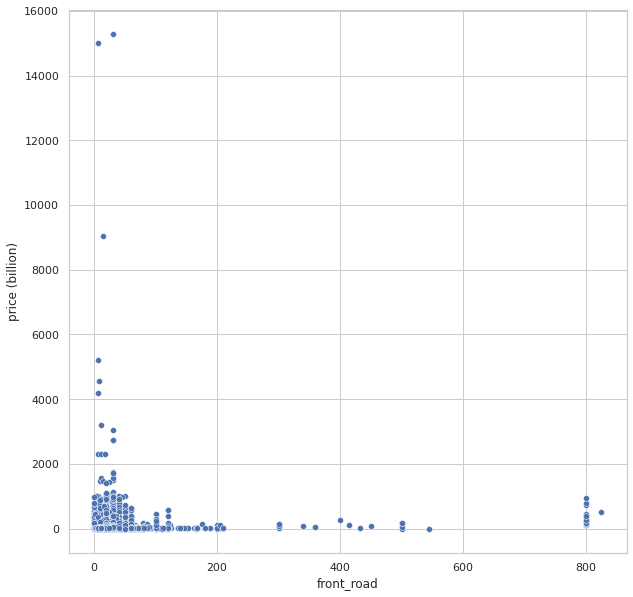

In [88]:
plt.figure(figsize=(10, 10))
sns.scatterplot(data=BDS_df4, x="front_road", y="price (billion)")


In [89]:
BDS_df4['front_road'].quantile(0.99)


40.0

In [90]:
BDS_df4 = BDS_df4[~(BDS_df4['front_road'] > BDS_df4['front_road'].quantile(0.99))].reset_index(drop=True)


In [91]:
BDS_df4['front_road'].isna().sum()


96151

### region


In [92]:
BDS_df4['region'].unique()


array(['Đồng Nai', 'Bình Dương', 'Tp Hồ Chí Minh', 'Hồ Chí Minh'],
      dtype=object)

In [93]:
BDS_df4['region'].replace({'Tp Hồ Chí Minh': 'Hồ Chí Minh'}, inplace=True)


<Figure size 720x720 with 0 Axes>

<AxesSubplot:xlabel='region', ylabel='price (billion)'>

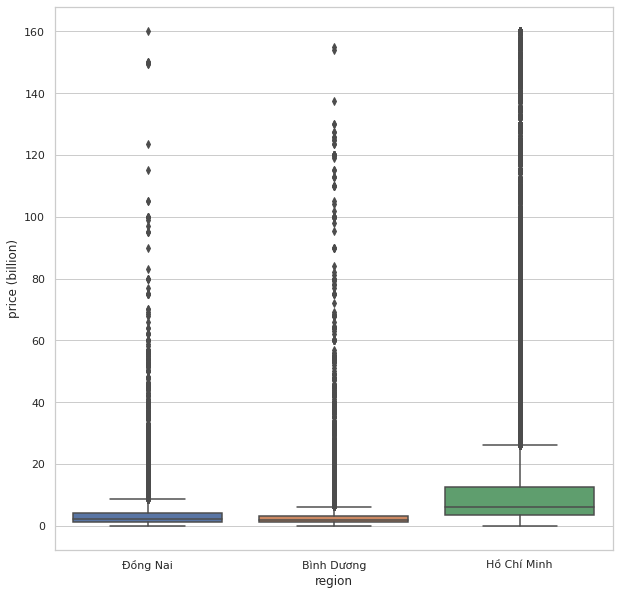

In [94]:
plt.figure(figsize=(10, 10))
sns.boxplot(data=BDS_df4[BDS_df4['price (billion)'] <=
            price_mark], x="region", y="price (billion)")


### area


In [95]:
region_cols = ['ward', 'area', 'region']
BDS_df4[region_cols].groupby(
    region_cols[1:]).count().sort_values(axis=0, by=['region'])


,,ward
area,region,
Huyện Bàu Bàng,Bình Dương,1075
Thị xã Bến Cát,Bình Dương,2165
Thành phố Thủ Dầu Một,Bình Dương,2833
Thành phố Thuận An,Bình Dương,3509
Thành phố Dĩ An,Bình Dương,1016
Thị xã Dĩ An,Bình Dương,2801
Huyện Phú Giáo,Bình Dương,205
Thị xã Tân Uyên,Bình Dương,1789
Huyện Dầu Tiếng,Bình Dương,402


In [96]:
BDS_df4.replace({'Thị xã Dĩ An': 'Thành phố Dĩ An',
                'Thành phố Biên Hoà': 'Thành phố Biên Hòa',
                 'Quận Thủ Đức': 'Thành phố Thủ Đức'}, inplace=True)


In [97]:
BDS_df4 = BDS_df4[BDS_df4['area'] != "Quận Bắc Từ Liêm"].reset_index(drop=True)


<Figure size 1440x720 with 0 Axes>

Text(0.5, 1.0, 'Giá bất động sản ở Tp Hồ Chí Minh')

<AxesSubplot:title={'center':'Giá bất động sản ở Tp Hồ Chí Minh'}, xlabel='price (billion)', ylabel='area'>

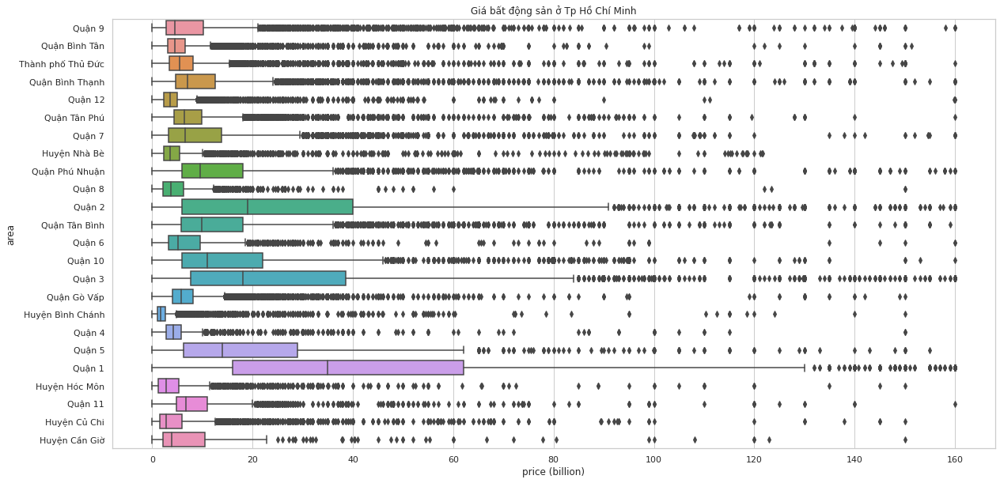

In [98]:
plt.figure(figsize=(20, 10))
# sns.countplot(x='region',data=BDS_df4)
BDS_HCM = BDS_df4[(BDS_df4['price (billion)'] <= price_mark)
                  & (BDS_df4['region'] == "Hồ Chí Minh")]
plt.title("Giá bất động sản ở Tp Hồ Chí Minh")
sns.boxplot(y='area', x='price (billion)', orient='h', data=BDS_HCM)


<Figure size 1440x360 with 0 Axes>

Text(0.5, 1.0, 'Giá bất động sản ở Bình Dương')

<AxesSubplot:title={'center':'Giá bất động sản ở Bình Dương'}, xlabel='price (billion)', ylabel='area'>

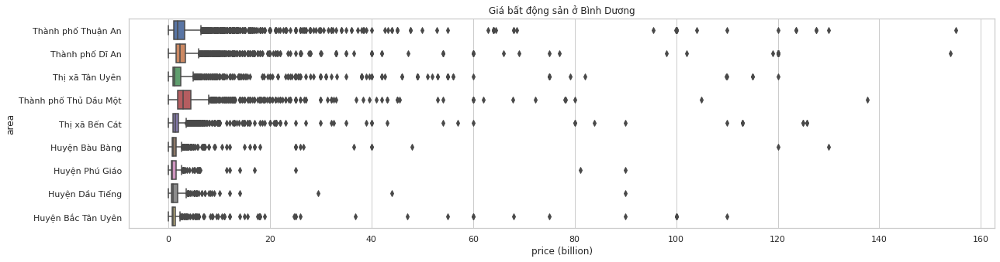

In [99]:
plt.figure(figsize=(20, 5))
# sns.countplot(x='region',data=BDS_df4)
BDS_BD = BDS_df4[(BDS_df4['price (billion)'] <= price_mark)
                 & (BDS_df4['region'] == "Bình Dương")]
plt.title("Giá bất động sản ở Bình Dương")
sns.boxplot(y='area', x='price (billion)', orient='h', data=BDS_BD)


<Figure size 1440x360 with 0 Axes>

Text(0.5, 1.0, 'Giá bất động sản ở Đồng Nai')

<AxesSubplot:title={'center':'Giá bất động sản ở Đồng Nai'}, xlabel='price (billion)', ylabel='area'>

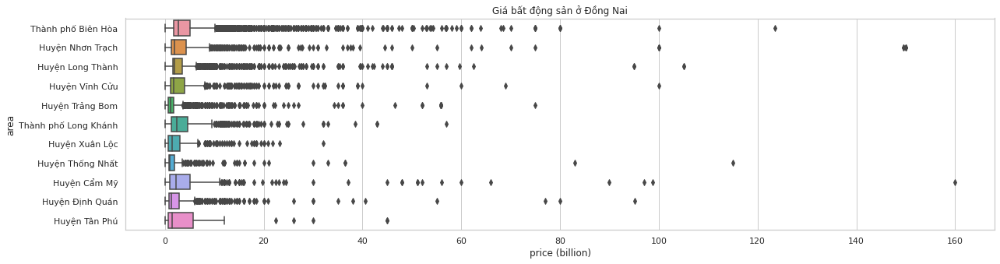

In [100]:
plt.figure(figsize=(20, 5))
# sns.countplot(x='region',data=BDS_df4)
BDS_DN = BDS_df4[(BDS_df4['price (billion)'] <= price_mark)
                 & (BDS_df4['region'] == "Đồng Nai")]
plt.title("Giá bất động sản ở Đồng Nai")
sns.boxplot(y='area', x='price (billion)', orient='h', data=BDS_DN)


In [101]:
BDS_df4.to_csv('data version/BDS_df4_new.csv', index=False)


### DF4


In [102]:
BDS_df4 = pd.read_csv('data version/BDS_df4_new.csv')


### ward


In [103]:
BDS_df5 = BDS_df4.copy()


In [104]:
BDS_df5['ward'].unique()


array(['Phường Tam Hòa', 'Phường Thống Nhất', 'Phường Hố Nai',
       'Phường Hoá An', 'Phường Bửu Long', 'Xã Đại Phước', 'Xã Phước An',
       'Phường An Bình', 'Phường Phước Tân', 'Phường Hòa Bình',
       'Phường Thanh Bình', 'Phường Quyết Thắng', 'Phường Tam Hiệp',
       'Phường Tân Hiệp', 'Phường Tân Biên', 'Phường Quang Vinh',
       'Phường Trảng Dài', 'Xã Long Đức', 'Thị trấn Long Thành',
       'Xã Long Hưng', 'Phường Long Bình Tân', 'Phường Tân Vạn',
       'Xã Cẩm Đường', 'Phường Tam Phước', 'Phường Tân Phong',
       'Xã Thạnh Phú', 'Xã Hố Nai 3', 'Phường Bửu Hòa', 'Xã Tây Hoà',
       'Phường Tân Mai', 'Phường Bình Đa', 'Phường Long Bình',
       'Xã Bình Hòa', 'Phường Tân Tiến', 'Phường Tân Hạnh', 'Xã Bắc Sơn',
       'Thị trấn Trảng Bom', 'Phường Bảo Vinh', 'Xã Trung Hoà',
       'Phường An Hoà', 'Thị trấn Hiệp Phước', 'Xã An Phước',
       'Phường Trung Dũng', 'Xã Quảng Tiến', 'Xã Xuân Bắc',
       'Xã Thiện Tân', 'Xã Bình Lợi', 'Xã Hưng Thịnh', 'Xã An Viễn',
       'X

In [105]:
BDS_df5['ward'].replace(
    {"xã Tân An Hội Xã Tân An Hội": "Xã Tân An Hội"}, inplace=True)


In [106]:
def replace_error_value(x):
    '''
        Kiểm tra và thay thế các giá trị không đúng định dạng trong thuộc tính ward
        Giá trị bắt đầu là "Xã", "Phường", "Thị trấn" là hợp lệ

        Parameters
        ----------
            - x (string): chuỗi giá trị cần kiểm tra

        Returns
        ----------
            - Kết quả sau khi kiểm tra
    '''
    if isinstance(x, (int, float)) or x == np.nan:
        return np.nan

    temp = x.lower()
    if temp.startswith(('xã', 'phường', 'thị trấn')):
        return x

    return np.nan


BDS_df5['ward'] = BDS_df5['ward'].apply(replace_error_value)


In [107]:
region_cols = ['ward', 'area', 'region']
BDS_df5[region_cols].groupby(
    region_cols).all().sort_values(axis=0, by=['region', 'area'])


,,
ward,area,region
Thị Trấn Bàu Bàng,Huyện Bàu Bàng,Bình Dương
Thị trấn Lai Uyên,Huyện Bàu Bàng,Bình Dương
Xã Cây Trường II,Huyện Bàu Bàng,Bình Dương
Xã Hưng Hòa,Huyện Bàu Bàng,Bình Dương
Xã Lai Hưng,Huyện Bàu Bàng,Bình Dương
Xã Long Nguyên,Huyện Bàu Bàng,Bình Dương
Xã Trừ Văn Thố,Huyện Bàu Bàng,Bình Dương
Xã Tân Hưng,Huyện Bàu Bàng,Bình Dương
Thị trấn Tân Thành,Huyện Bắc Tân Uyên,Bình Dương


In [108]:
BDS_df5.to_csv('data version/BDS_df5_new.csv', index=False)


### DF5


In [109]:
BDS_df5 = pd.read_csv('data version/BDS_df5_new.csv')


### Property legal document


In [110]:
BDS_df6 = BDS_df5.copy()


In [111]:
property_doc = ['property_legal_document', 'website']
BDS_df6[property_doc].groupby(
    property_doc[0]).count().sort_values(by=['website'])


,website
property_legal_document,
Giấy phép KD,18
Giấy phép XD,147
Giấy tờ hợp lệ,3850
Giấy tờ khác,4605
Đang chờ sổ,5898
Đã có sổ,70271
Sổ hồng/ Sổ đỏ,83830


<Figure size 1440x576 with 0 Axes>

<AxesSubplot:xlabel='property_legal_document', ylabel='price (billion)'>

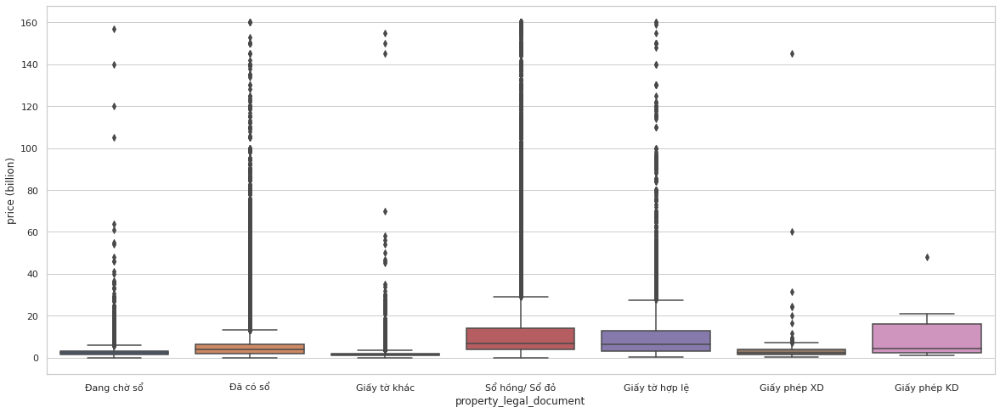

In [112]:
plt.figure(figsize=(20, 8))
sns.boxplot(data=BDS_df6[BDS_df6['price (billion)'] <= price_mark],
            x='property_legal_document', y='price (billion)')


In [113]:
BDS_df6['property_legal_document'].replace({"Sổ hồng/ Sổ đỏ": "Đã có sổ",
                                            "Giấy tờ hợp lệ": "Giấy tờ khác",
                                            "Giấy phép XD": "Giấy tờ khác",
                                            "Giấy phép KD": "Giấy tờ khác"}, inplace=True)


In [114]:
# Load lại giá trị đã fit_transform trước đó
# BDS_df6_old = pd.read_csv('data version/BDS_df6.csv')
# BDS_df6['property_legal_document'] = BDS_df6_old.property_legal_document
BDS_df6['property_legal_document'] = BDS_df6['property_legal_document'].astype(
    'category')


In [115]:
BDS_df6.to_csv('data version/BDS_df6_new.csv', index=False)


### DF6


In [116]:
BDS_df6 = pd.read_csv('data version/BDS_df6_new.csv')


### floors


In [117]:
BDS_df7 = BDS_df6.copy()


In [118]:
BDS_df7['floors'].unique()


array(['Nhiều hơn 10', '1', '3', '2', '4', '5', '6', '7', '10', '9', '8',
       nan, '2.0', '1.0', '18.0', '23.0', '4.0', '6.0', '3.0', '26.0',
       '35.0', '10.0', '30.0', '15.0', '12.0', '8.0', '40.0', '38.0',
       '5.0', '29.0', '19.0', '31.0', '9.0', '33.0', '17.0', '20.0',
       '13.0', '22.0', '24.0', '11.0', '14.0', '27.0', '16.0', '25.0',
       '36.0', '7.0', '21.0', '28.0', '32.0', '34.0', '37.0', 28.0, 1.0,
       11.0, 4.0, 3.0, 2.0, 24.0, 34.0, 7.0, 5.0, 29.0, 30.0, 15.0, 12.0,
       27.0, 10.0, 9.0, 18.0, 14.0, 20.0, 17.0, 22.0, 19.0, 151.0, 8.0,
       6.0, 26.0, 23.0, 25.0, 16.0, 36.0, 50.0, 61.0, 13.0, 33.0, 40.0,
       39.0, 35.0, 48.0, 42.0, 44.0, 37.0, 38.0, 21.0, 32.0, 75.0, 2000.0,
       31.0, 988.0, 333.0, 163.0, 45.0, 144.0, 43.0, 91.0, 46.0, 55.0,
       52.0], dtype=object)

In [119]:
BDS_df7['floors'] = BDS_df7['floors'].apply(lambda x: int(
    float(x)) if isinstance(x, str) and "Nhiều hơn" not in x else x)

BDS_df7['floors'] = BDS_df7['floors'].apply(
    DPP.convertNum2Int, convert_dtype=False)


In [120]:
floors = BDS_df7['floors'].unique()[1:]
k_floors = floors[floors > 81]
k_floors

array([151, 2000, 988, 333, 163, 144, 91], dtype=object)

In [121]:
# Loại các tin đăng có số lầu lớn hơn 81 vì nó không tồn tại ở Việt Nam hiện tại
BDS_df7 = BDS_df7[~(BDS_df7['floors'].isin(k_floors))]
BDS_df7.reset_index(drop=True, inplace=True)


In [122]:
# # Gom nhóm các giá trị có số lầu nhiều hơn 10
# BDS_df7['floors'].replace(floors[floors > 10], 'Nhiều hơn 10', inplace=True)


In [123]:
for i in range(BDS_df7.shape[0]):
    if BDS_df7.loc[i,'type_real_estate'] == 'Đất':
        BDS_df7.at[i,'floors'] = 0

<Figure size 720x720 with 0 Axes>

<AxesSubplot:xlabel='price (billion)', ylabel='floors'>

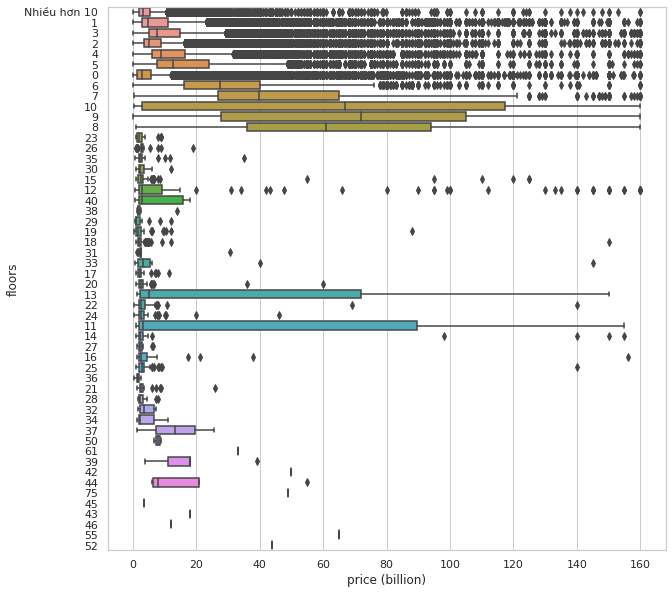

In [124]:
plt.figure(figsize=(10, 10))
sns.boxplot(data=BDS_df7[BDS_df7['price (billion)'] <=
            price_mark], y="floors", x="price (billion)", orient='h')


In [125]:
BDS_df7.to_csv('data version/BDS_df7_new.csv', index=False)


### DF7


In [126]:
# BDS_df7 = pd.read_csv('data version/BDS_df7_new.csv')


### rooms


In [127]:
BDS_df8 = BDS_df7.copy()


In [128]:
BDS_df8['rooms'].unique()


array(['2', '1', '3', '4', '10', '8', '6', '9', '5', '7', 'Nhiều hơn 10',
       nan, '3.0', '18.0', '24.0', '2.0', '4.0', '35.0', '1.0', '30.0',
       '5.0', '8.0', '6.0', '22.0', '12.0', '54.0', '68.0', '36.0',
       '10.0', '7.0', '20.0', '55.0', '14.0', '16.0', '15.0', '13.0',
       '9.0', '25.0', '11.0', '17.0', '32.0', '28.0', 3.0, 2.0, 13.0, 7.0,
       4.0, 5.0, 1.0, 12.0, 6.0, 20.0, 8.0, 9.0, 14.0, 32.0, 15.0, 10.0,
       11.0, 22.0, 21.0, 17.0, 16.0, 30.0, 27.0, 95.0, 19.0, 43.0, 37.0,
       18.0, 60.0, 40.0, 62.0, 50.0, 120.0, 42.0, 68.0, 25.0, 100.0, 36.0,
       33.0, 23.0, 110.0, 29.0, 35.0, 24.0, 72.0, 45.0, 58.0, 31.0, 192.0,
       26.0, 44.0, 160.0, 48.0, 65.0, 74.0, 34.0, 41.0, 39.0, 80.0, 104.0,
       46.0, 28.0, 55.0, 51.0, 89.0, 84.0, 63.0, 61.0, 56.0, 105.0, 71.0,
       54.0, 67.0, 66.0, 70.0, 85.0, 88.0, 90.0, 52.0, 111.0, 101.0,
       150.0, 123.0, 373.0, 145.0, 114.0, 57.0, 75.0, 115.0, 200.0, 94.0,
       49.0, 125.0, 69.0, 162.0, 102.0, 195.0, 170.0,

In [129]:
BDS_df8['rooms'] = BDS_df8['rooms'].apply(lambda x: int(
    float(x)) if isinstance(x, str) and "Nhiều hơn" not in x else x)

BDS_df8['rooms'] = BDS_df8['rooms'].apply(
    DPP.convertNum2Int, convert_dtype=False)

In [130]:
# rooms = list(BDS_df8['rooms'].unique())
# rooms.remove('Nhiều hơn 10')

# rooms = np.array(rooms)
# # Gom nhóm các giá trị có số phòng nhiều hơn 10
# BDS_df8['rooms'].replace(rooms[rooms > 10], 'Nhiều hơn 10', inplace=True)

In [131]:
for i in range(BDS_df8.shape[0]):
    if BDS_df8.loc[i,'type_real_estate'] == 'Đất':
        BDS_df8.at[i,'rooms'] = 0


<AxesSubplot:xlabel='rooms', ylabel='price (billion)'>

Text(0.5, 1.0, 'Chưa điền giá trị')

<AxesSubplot:xlabel='rooms', ylabel='price (billion)'>

Text(0.5, 1.0, 'Đã điền giá trị')

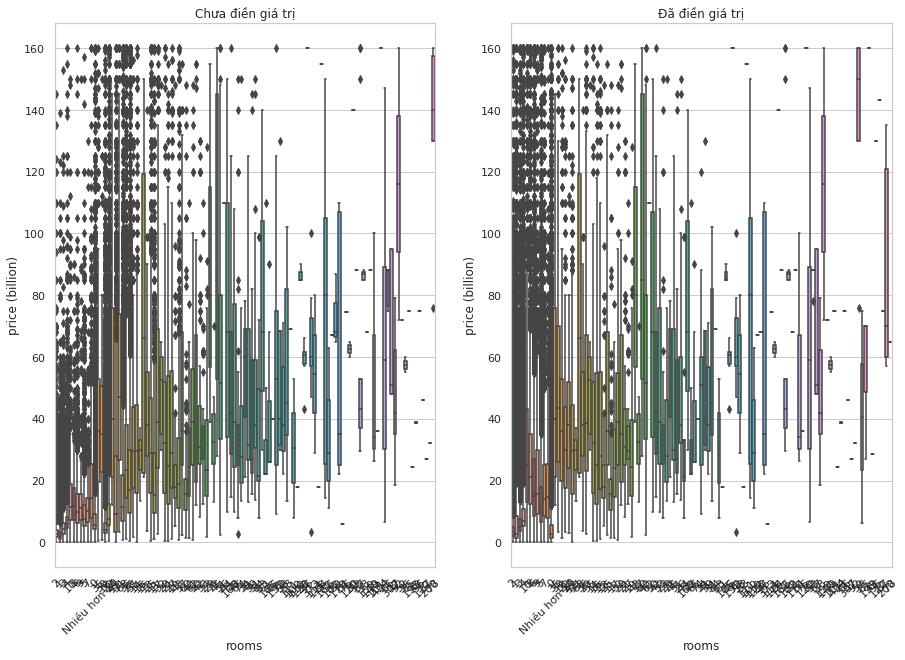

In [132]:
# plt.figure(figsize=(10, 10))
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 10), sharex=True)

sns.boxplot(data=BDS_df1[BDS_df1['price (billion)'] <= price_mark],
            x="rooms", y="price (billion)", ax=axes[0])
axes[0].set_title("Chưa điền giá trị")
axes[0].tick_params(axis='x',labelrotation=45)
sns.boxplot(data=BDS_df8[BDS_df8['price (billion)'] <= price_mark],
            x="rooms", y="price (billion)", ax=axes[1])
axes[1].set_title("Đã điền giá trị")
axes[1].tick_params(axis='x',labelrotation=45)


### list time


In [133]:
BDS_df8['list_time'] = pd.to_datetime(BDS_df8['list_time'], format="%d/%m/%Y")


In [134]:
BDS_df8['list_time'].sample(5)


113198   2021-10-18
185149   2021-11-07
149596   2021-11-04
21810    2021-11-05
86503    2021-10-25
Name: list_time, dtype: datetime64[ns]

In [135]:
BDS_df8.drop(["floornumber", "balconydirection", "property_status",
              "furnishing_sell"], axis=1, inplace=True)


In [136]:
BDS_df8.dropna(axis=0,subset=['ward','area', 'region'], inplace=True)


In [137]:
BDS_df8.columns

Index(['list_time', 'ward', 'area', 'region', 'direction',
       'property_legal_document', 'size (m2)', 'rooms', 'toilets', 'floors',
       'living_size (m2)', 'width (m)', 'length (m)', 'price (billion)',
       'type_details', 'website', 'front_road', 'type_real_estate'],
      dtype='object')

In [138]:
from sklearn.impute import SimpleImputer
imputer1 = SimpleImputer(strategy='most_frequent')

In [139]:
cate_impute = imputer1.fit_transform(BDS_df8[['rooms', 'toilets', 'floors','direction',
                                'type_details', 'type_real_estate', 'property_legal_document']])


In [140]:
BDS_df8[['rooms', 'toilets', 'floors','direction',
         'type_details', 'type_real_estate', 'property_legal_document']] = cate_impute


In [141]:
floors[floors > 10]

array([18, 23, 26, 35, 30, 15, 12, 40, 38, 29, 19, 31, 33, 17, 20, 13, 22,
       24, 11, 14, 27, 16, 25, 36, 21, 28, 32, 34, 37, 151, 50, 61, 39,
       48, 42, 44, 75, 2000, 988, 333, 163, 45, 144, 43, 91, 46, 55, 52],
      dtype=object)

In [142]:

BDS_df8['floors'].replace(floors[floors > 10], 'Nhiều hơn 10', inplace=True)

In [143]:
rooms = list(BDS_df8['rooms'].unique())
rooms.remove('Nhiều hơn 10')

rooms = np.array(rooms)
# Gom nhóm các giá trị có số phòng nhiều hơn 10
BDS_df8['rooms'].replace(rooms[rooms > 10], 'Nhiều hơn 10', inplace=True)

In [144]:
from sklearn.impute import SimpleImputer
imputer2 = SimpleImputer(strategy='median')
df8_impute = imputer2.fit_transform(BDS_df8[['size (m2)', 'living_size (m2)',
                                             'width (m)', 'length (m)', 'front_road']])


In [145]:
BDS_df8[['size (m2)', 'living_size (m2)', 'width (m)', 'length (m)', 'front_road']] = df8_impute


In [146]:
BDS_df8.to_csv('data version/BDS_df8_new.csv', index=False)


### DF8


In [147]:
# BDS_df8 = pd.read_csv('data version/BDS_df8_new.csv')


## 3.1 Overview


In [151]:
BDS_df8.toilets.unique()

array(['2', '1', '0', '5', '3', 'Nhiều hơn 6', '4', '6'], dtype=object)

In [149]:
BDS_df8['toilets'].replace({'0.0':'0', 0.0: '0'}, inplace=True)

In [150]:
BDS_df9 = BDS_df8.copy()
BDS_df9.drop_duplicates(inplace=True)
# BDS_df9.dropna(inplace=True)


In [152]:
BDS_df9.reset_index(drop=True, inplace=True)

In [153]:
BDS_df9.dropna(inplace=True)


In [154]:
BDS_df9.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 212058 entries, 0 to 212057
Data columns (total 18 columns):
 #   Column                   Non-Null Count   Dtype         
---  ------                   --------------   -----         
 0   list_time                212058 non-null  datetime64[ns]
 1   ward                     212058 non-null  object        
 2   area                     212058 non-null  object        
 3   region                   212058 non-null  object        
 4   direction                212058 non-null  object        
 5   property_legal_document  212058 non-null  object        
 6   size (m2)                212058 non-null  float64       
 7   rooms                    212058 non-null  object        
 8   toilets                  212058 non-null  object        
 9   floors                   212058 non-null  object        
 10  living_size (m2)         212058 non-null  float64       
 11  width (m)                212058 non-null  float64       
 12  length (m)      

In [155]:
BDS_df9.describe(include='all')


,list_time,ward,area,region,direction,property_legal_document,size (m2),rooms,toilets,floors,living_size (m2),width (m),length (m),price (billion),type_details,website,front_road,type_real_estate
count,212058,212058,212058,212058,212058,212058,2.120580e+05,212058.0,212058,212058.0,2.120580e+05,212058.000000,212058.000000,212058.000000,212058,212058,212058.000000,212058
unique,374,443,44,3,8,3,NaN,12.0,8,12.0,NaN,NaN,NaN,NaN,21,2,NaN,4
top,2021-11-07 00:00:00,Phường 12,Quận Gò Vấp,Hồ Chí Minh,Đông Nam,Đã có sổ,NaN,2.0,0,0.0,NaN,NaN,NaN,NaN,Nhà ngõ,alonhadat,NaN,Nhà ở
freq,26534,7182,19834,178459,170087,197607,NaN,50546.0,147551,60125.0,NaN,NaN,NaN,NaN,86482,118355,NaN,149156
first,2019-05-31 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,2021-11-08 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,NaN,NaN,7.521968e+03,NaN,NaN,NaN,6.631670e+04,6.735021,21.416742,14.054441,NaN,NaN,9.290393,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,2.091010e+06,NaN,NaN,NaN,2.074303e+07,10.039084,238.592248,68.921422,NaN,NaN,6.027305,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,1.000000e+00,NaN,NaN,NaN,1.000000e+00,0.130000,0.540540,0.000385,NaN,NaN,0.000000,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,5.400000e+01,NaN,NaN,NaN,1.000000e+02,4.000000,14.000000,2.730000,NaN,NaN,7.000000,NaN


In [156]:
BDS_df9['list_time'] = pd.to_datetime(BDS_df9['list_time'])
BDS_df9['direction'] = BDS_df9['direction'].astype('category')
BDS_df9['property_legal_document'] = BDS_df9['property_legal_document'].astype(
    'category')
BDS_df9['rooms'] = BDS_df9['rooms'].astype('category')
BDS_df9['toilets'] = BDS_df9['toilets'].astype('category')
BDS_df9['floors'] = BDS_df9['floors'].astype('category')


In [157]:
BDS_df9.to_csv('BDS_new.csv', index=False)


In [166]:
# BDS_df19 = pd.read_csv('BDS_new.csv')


In [158]:
BDS_df10 = BDS_df9.copy()


## 3.2 Numeric variables


<Figure size 720x576 with 0 Axes>

<AxesSubplot:>

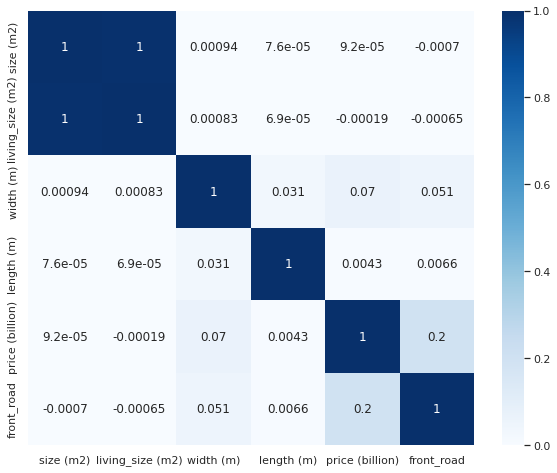

In [159]:
plt.figure(figsize=(10, 8))
sns.heatmap(data=BDS_df9.corr(), cmap="Blues", annot=True)


In [160]:
# Loại bỏ các giá trị outlier
for column in BDS_df10.columns:
    if BDS_df10[column].dtype == float:
        BDS_df10 = BDS_df10[BDS_df10[column] <= BDS_df10[column].quantile(0.98)]

In [162]:
BDS_df10.to_csv('BDS.csv', index=False)

<Figure size 720x576 with 0 Axes>

<AxesSubplot:>

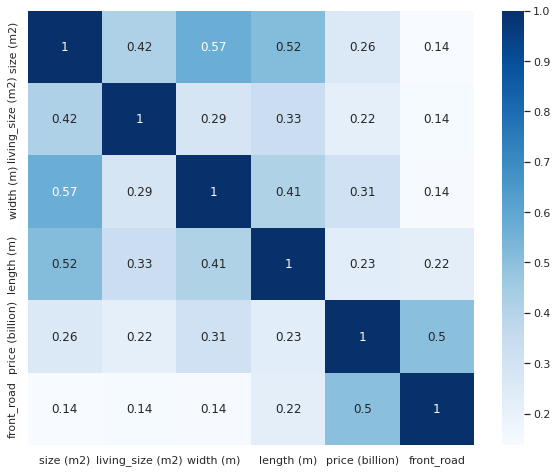

In [161]:
plt.figure(figsize=(10, 8))
sns.heatmap(data=BDS_df10.corr(), cmap="Blues", annot=True)


### Price


In [163]:
BDS_df9['price (billion)'].describe()


count    212058.000000
mean         14.054441
std          68.921422
min           0.000385
25%           2.730000
50%           5.300000
75%          11.000000
max       15272.000000
Name: price (billion), dtype: float64

In [164]:
outlier_df = BDS_df9[BDS_df9['price (billion)'] > price_mark].reset_index(
    drop=True)


In [165]:
BDS_df9 = BDS_df9[~(BDS_df9['price (billion)'] > price_mark)
                  ].reset_index(drop=True)


In [166]:
BDS_df9.shape


(210171, 18)

<AxesSubplot:>

Text(0.5, 1.0, 'Các giá trị trong vùng quan sát')

<AxesSubplot:>

Text(0.5, 1.0, 'Các giá trị outlier')

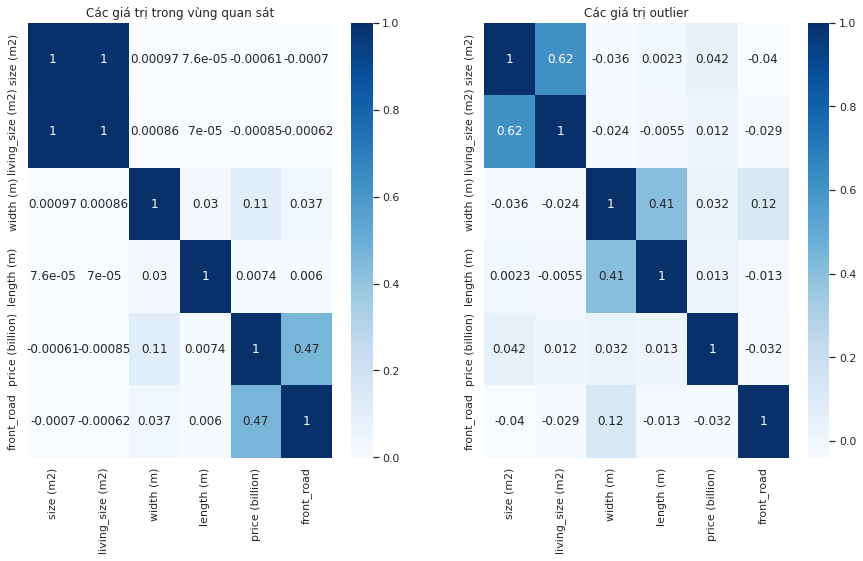

In [167]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 8))

sns.heatmap(data=BDS_df9.corr(), cmap="Blues", annot=True, ax=axes[0])
axes[0].set_title("Các giá trị trong vùng quan sát")
sns.heatmap(data=outlier_df.corr(), cmap="Blues", annot=True, ax=axes[1])
axes[1].set_title("Các giá trị outlier")


<div> => Đối với các giá trị nằm trong vùng quan sát của dữ liệu, chiều rộng mặt đường có ảnh hưởng đồng biến đến giá bất động sản. Diện tích đất và diện tích sử dụng có mối quan hệ hoàn toàn đồng biến</div>
<div>  </div>


<Figure size 1440x720 with 0 Axes>

Text(0.5, 1.0, 'Sự phân bố giá bất động sản')

<AxesSubplot:title={'center':'Sự phân bố giá bất động sản'}, xlabel='price (billion)', ylabel='Count'>

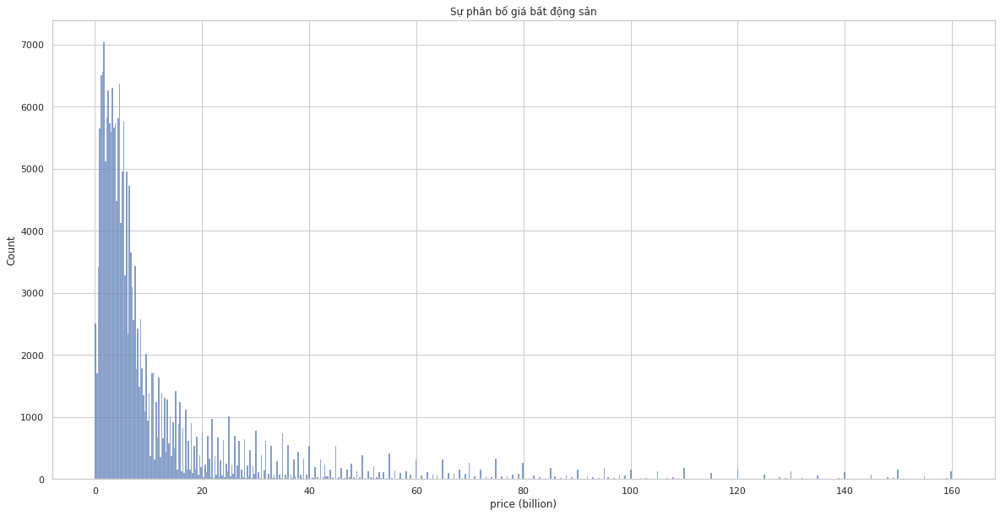

In [168]:
plt.figure(figsize=(20, 10))
plt.title("Sự phân bố giá bất động sản")
sns.histplot(data=BDS_df9, x="price (billion)")


<Figure size 1440x720 with 0 Axes>

Text(0.5, 1.0, 'Sự phân bố giá bất động sản')

<AxesSubplot:title={'center':'Sự phân bố giá bất động sản'}, xlabel='price (billion)', ylabel='Count'>

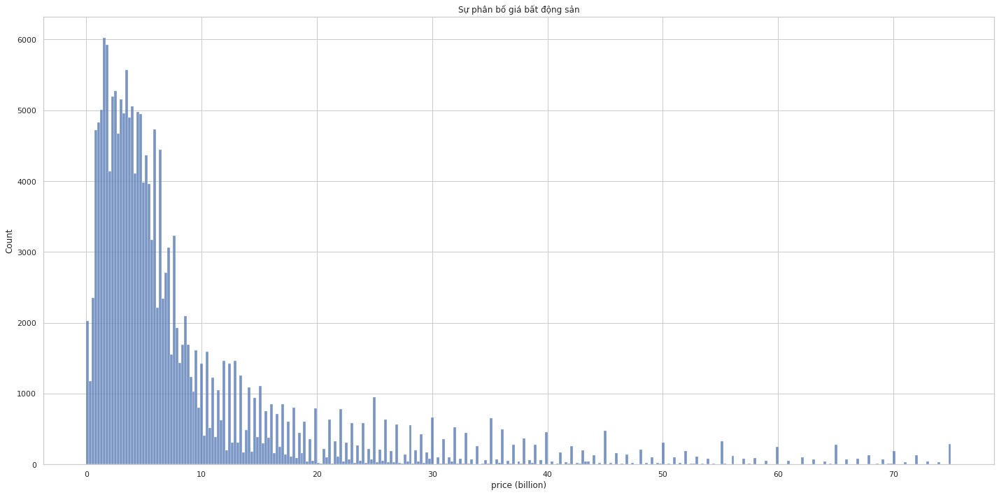

In [195]:
plt.figure(figsize=(20, 10))
plt.title("Sự phân bố giá bất động sản")
sns.histplot(data=BDS_df10, x="price (billion)")


<AxesSubplot:>

Text(0.5, 1.0, 'Căn hộ/Chung cư')

<AxesSubplot:>

Text(0.5, 1.0, 'Nhà ở')

<AxesSubplot:>

Text(0.5, 1.0, 'Đất')

<AxesSubplot:>

Text(0.5, 1.0, 'Khác')

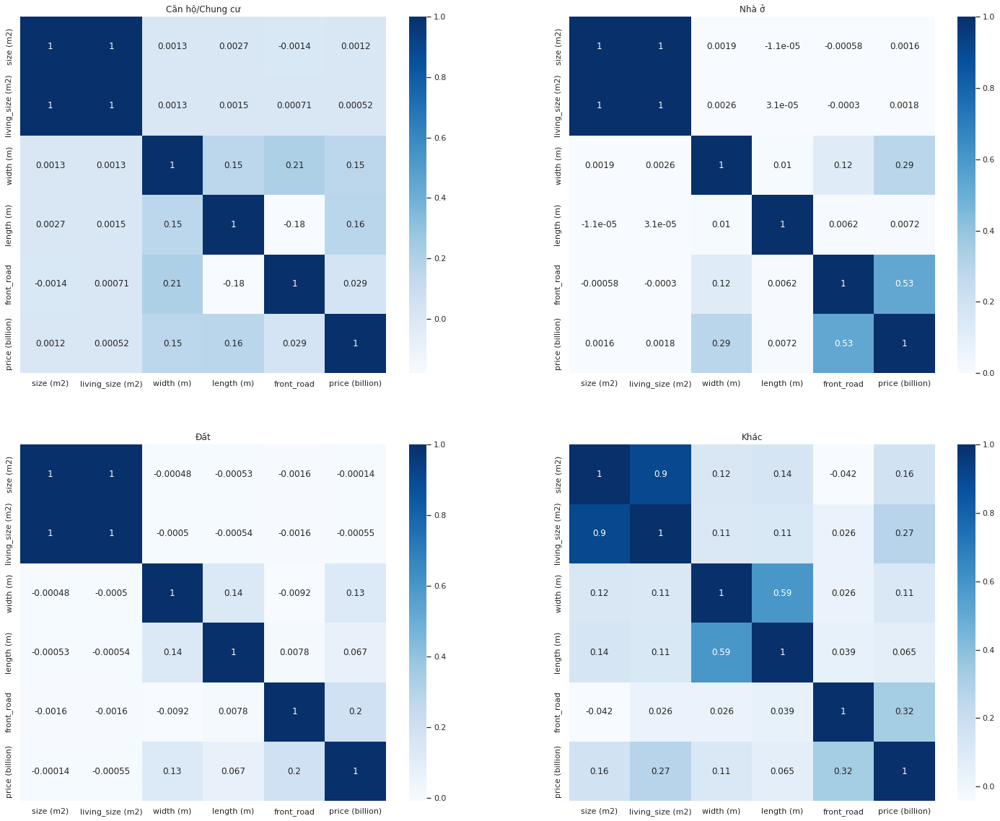

In [169]:
fig, axes = plt.subplots(2, 2, figsize=(25, 20))
col, row = 0, 0
features = ['size (m2)', 'living_size (m2)', 'width (m)',
            'length (m)', 'front_road', 'price (billion)']
for val in ['Căn hộ/Chung cư', 'Nhà ở', 'Đất', 'Khác']:
    sns.heatmap(data=BDS_df9[BDS_df9['type_real_estate'] == val][features].corr(
    ), cmap="Blues", annot=True, ax=axes[row, col])
    axes[row, col].set_title(val)
    col += 1
    if col > 1:
        col = 0
        row += 1


In [170]:
outlier_df['price (billion)'].describe()


count     1887.000000
mean       367.478589
std        610.981650
min        160.050000
25%        195.000000
50%        255.000000
75%        360.000000
max      15272.000000
Name: price (billion), dtype: float64

In [171]:
# sns.histplot(data=outlier_df, x="price (million)")


In [172]:
# plt.figure(figsize=(10, 10))
# fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 10))

# sns.histplot(data=BDS_df9, x="price (million)", ax=axes[0])
# axes[0].set_title("Các giá trị trong vùng quan sát")
# sns.histplot(data=outlier_df, x="price (million)", ax=axes[1])
# axes[1].set_title("Các giá trị outlier)


=> Giá bất động sản phân bổ chủ yếu trong khoảng dưới 11 tỷ đồng


In [173]:
group_price = ['Giá rẻ', 'Tầm trung', 'Cao cấp', 'Siêu cao cấp']
# Giá rẻ :0 - 2 tỷ
# Tầm trung: 2 - 5 tỷ
# Cao cấp: 5 - 20 tỷ
# Siêu cao cấp: trên 20 tỷ
bins_price = [0, 2, 5, 20, max(BDS_df9['price (billion)'])]
BDS_df9['price-binned'] = pd.cut(BDS_df9['price (billion)'],
                                 bins=bins_price, labels=group_price)


In [174]:
price_binned = BDS_df9['price-binned'].value_counts().to_frame()
price_binned['ratio'] = round(price_binned['price-binned']*100/price_binned['price-binned'].sum(), 2)
price_binned

,price-binned,ratio
Cao cấp,80720,38.41
Tầm trung,64422,30.65
Giá rẻ,37946,18.05
Siêu cao cấp,27083,12.89


<Figure size 1440x576 with 0 Axes>

Text(0.5, 1.0, 'Số lượng giá bất động sản theo phân khúc sản phẩm')

<AxesSubplot:title={'center':'Số lượng giá bất động sản theo phân khúc sản phẩm'}, xlabel='price-binned', ylabel='count'>

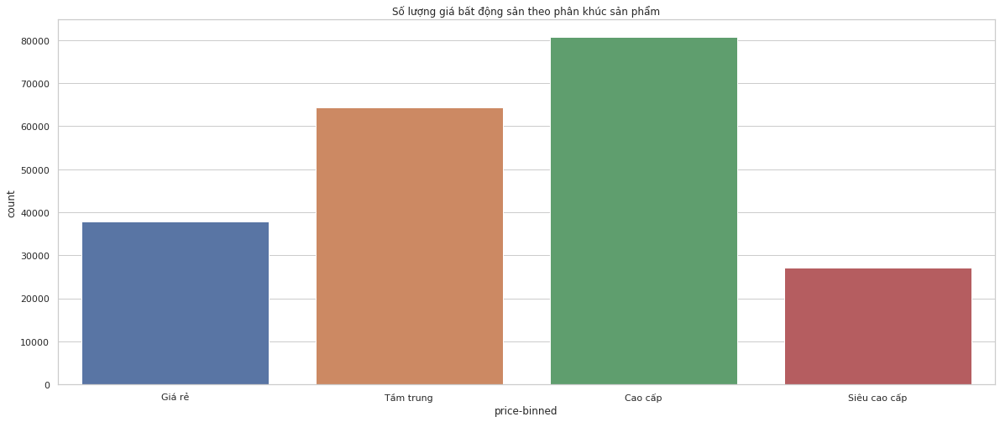

In [175]:
plt.figure(figsize=(20, 8))
plt.title("Số lượng giá bất động sản theo phân khúc sản phẩm")
sns.countplot(x='price-binned', data=BDS_df9)


=> Phân khúc giá BĐS tập trung chủ yếu là các BĐS tầm trung và cao cấp


## 3.3 Categorical variables


In [176]:
cate_var = [col for col in BDS_df9.columns if BDS_df9[col].dtype != "float"][:-1]
cate_var


['list_time',
 'ward',
 'area',
 'region',
 'direction',
 'property_legal_document',
 'rooms',
 'toilets',
 'floors',
 'type_details',
 'website',
 'type_real_estate']

### Website


In [177]:
BDS_df9['website'].unique()


array(['Chotot', 'alonhadat'], dtype=object)

<Figure size 720x504 with 0 Axes>

Text(0.5, 1.0, 'Phân khúc giá bất động sản trên website')

<AxesSubplot:title={'center':'Phân khúc giá bất động sản trên website'}, xlabel='website', ylabel='price (billion)'>

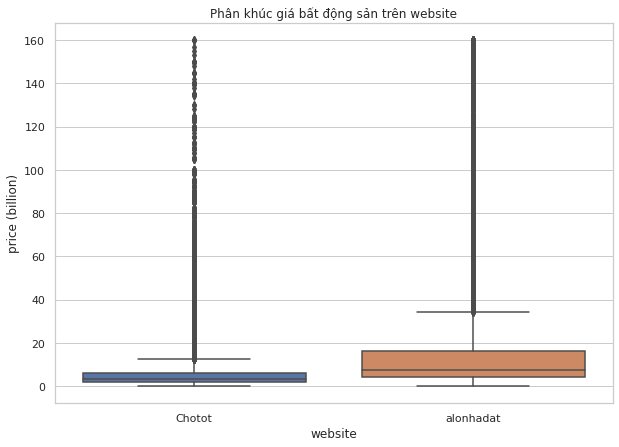

In [178]:
plt.figure(figsize=(10, 7))
plt.title("Phân khúc giá bất động sản trên website")
sns.boxplot(x='website', y='price (billion)',
              data=BDS_df9)


<Figure size 1440x576 with 0 Axes>

Text(0.5, 1.0, 'Phân khúc giá bất động sản trên website')

<AxesSubplot:title={'center':'Phân khúc giá bất động sản trên website'}, xlabel='website', ylabel='count'>

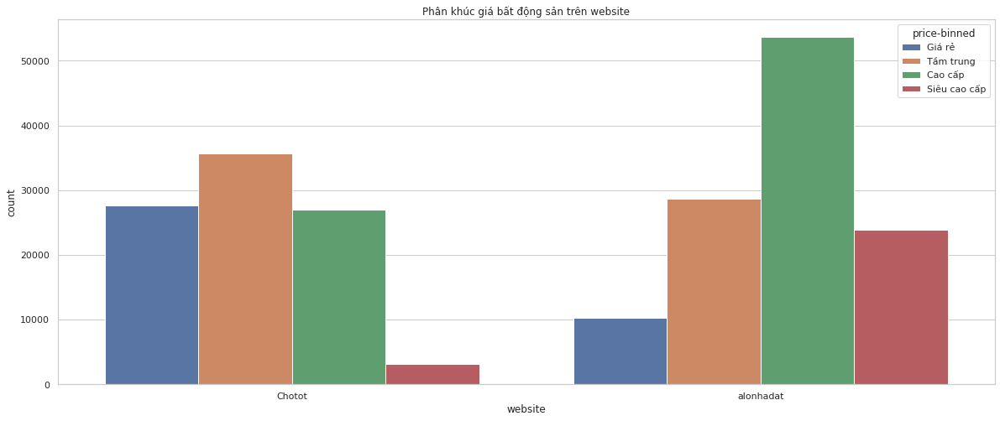

In [179]:
plt.figure(figsize=(20, 8))
plt.title("Phân khúc giá bất động sản trên website")
sns.countplot(x='website', hue='price-binned',
              data=BDS_df9)


<div> => Chotot tập trung chủ yếu các BĐS giá rẻ, tầm trung và cao cấp. Các BĐS siêu cao cấp chỉ chiếm thị phần nhỏ </div>
<div> => alonhadat chủ yếu được đăng bán các sản phẩm cao cấp </div>


### **Region, area, ward**


<AxesSubplot:xlabel='region', ylabel='price (billion)'>

<AxesSubplot:xlabel='region', ylabel='price (billion)'>

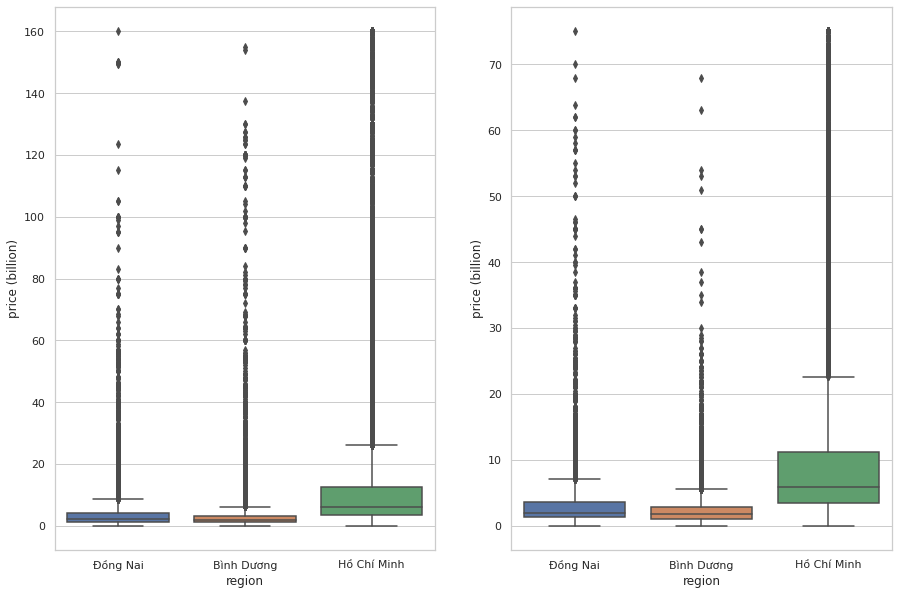

In [180]:
# plt.figure(figsize=(15, 10))
fig, axes = plt.subplots(1,2, figsize=(15, 10))
sns.boxplot(x='region', y='price (billion)',
            data=BDS_df9, ax=axes[0])

sns.boxplot(x='region', y='price (billion)',
            data=BDS_df10, ax=axes[1])

<AxesSubplot:xlabel='region', ylabel='price (billion)'>

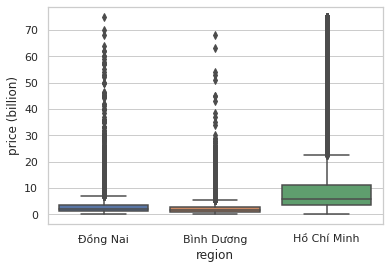

In [181]:
sns.boxplot(x='region', y='price (billion)',
            data=BDS_df10)

=> Ta nhận thấy rằng các BĐS ở khu vực Tp Hồ Chí Minh có sự đa dạng về phân khúc hơn so với Bình Dương, Đồng Nai.


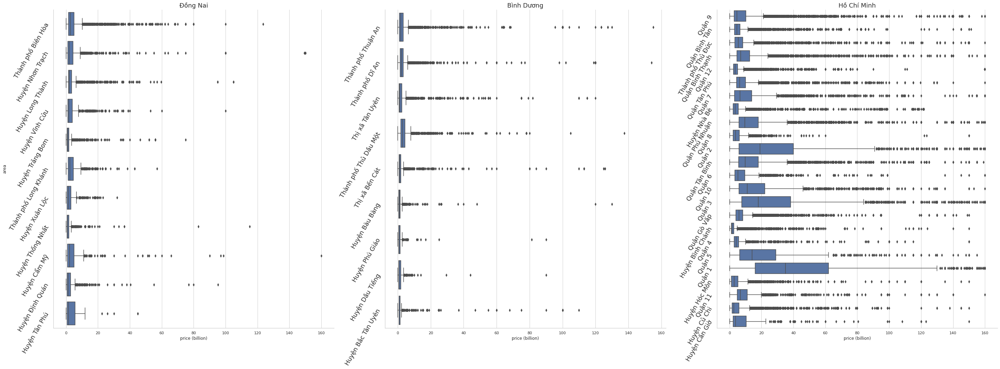

In [182]:
g = sns.FacetGrid(BDS_df9, col='region', sharey=False,
                  sharex=False, height=15, aspect=0.9, col_wrap=3)

g.map(sns.boxplot, 'price (billion)', 'area', orient='h')
g.set_titles("{col_name}", size=18)
# g.fig.suptitle('Giá bất động sản tại các tỉnh')

g.set_yticklabels(rotation=60, fontsize=18)

g.fig.tight_layout()
plt.show()


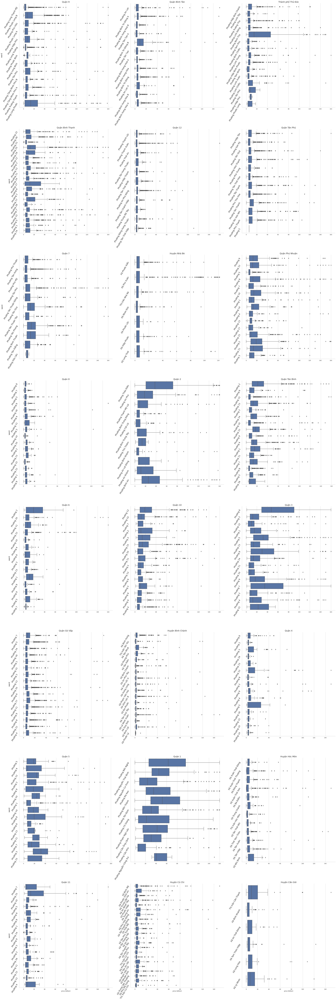

In [183]:
g = sns.FacetGrid(BDS_df9[BDS_df9['region'] == 'Hồ Chí Minh'], col='area', sharey=False,
                  sharex=False, height=15, aspect=0.9, col_wrap=3)

g.map(sns.boxplot, 'price (billion)', 'ward', orient='h')
g.set_titles("{col_name}", size=18)
# g.fig.suptitle('Giá bất động sản tại các tỉnh')

# g.set_xticklabels(fontsize=18)
g.set_yticklabels(rotation=60, fontsize=18)
g.set_ylabels(fontsize=16)


g.fig.tight_layout()
plt.show()


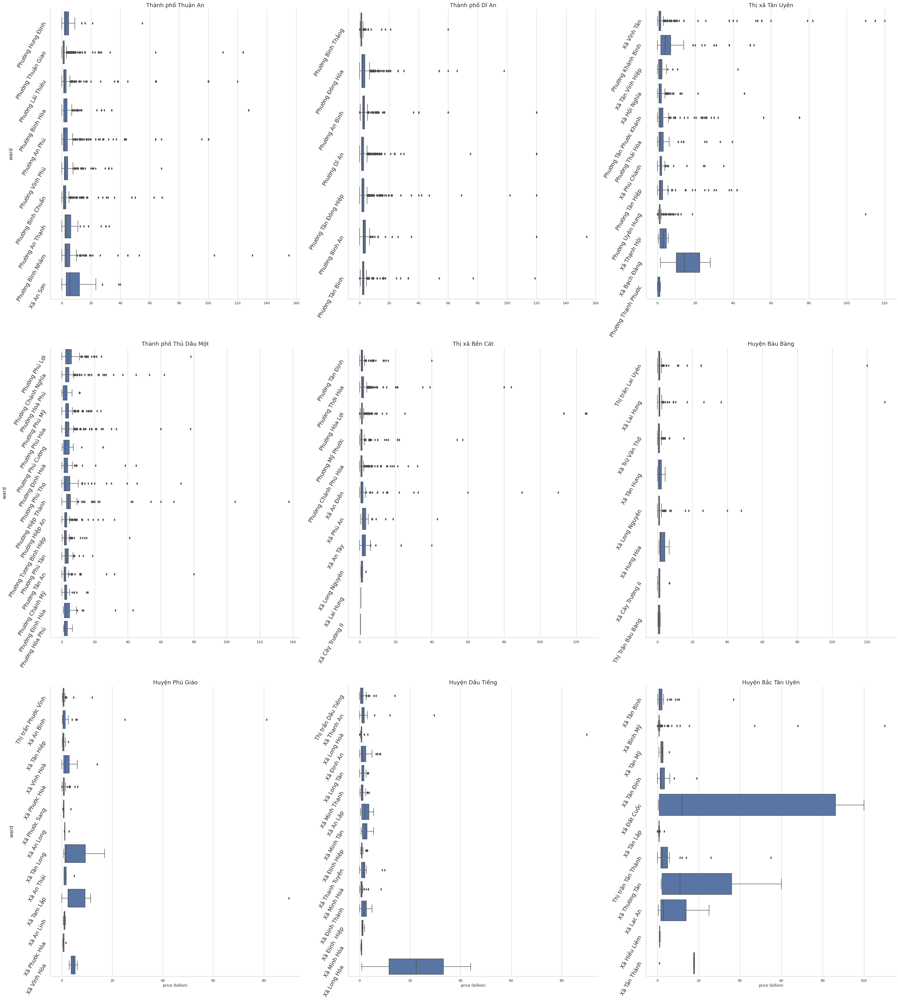

In [184]:
g = sns.FacetGrid(BDS_df9[BDS_df9['region'] == 'Bình Dương'], col='area', sharey=False,
                  sharex=False, height=15, aspect=0.9, col_wrap=3)

g.map(sns.boxplot, 'price (billion)', 'ward', orient='h')
g.set_titles("{col_name}", size=18)
# g.fig.suptitle('Giá bất động sản tại các tỉnh')

# g.set_xticklabels(fontsize=18)
g.set_yticklabels(rotation=60, fontsize=18)
g.set_ylabels(fontsize=16)


g.fig.tight_layout()
plt.show()


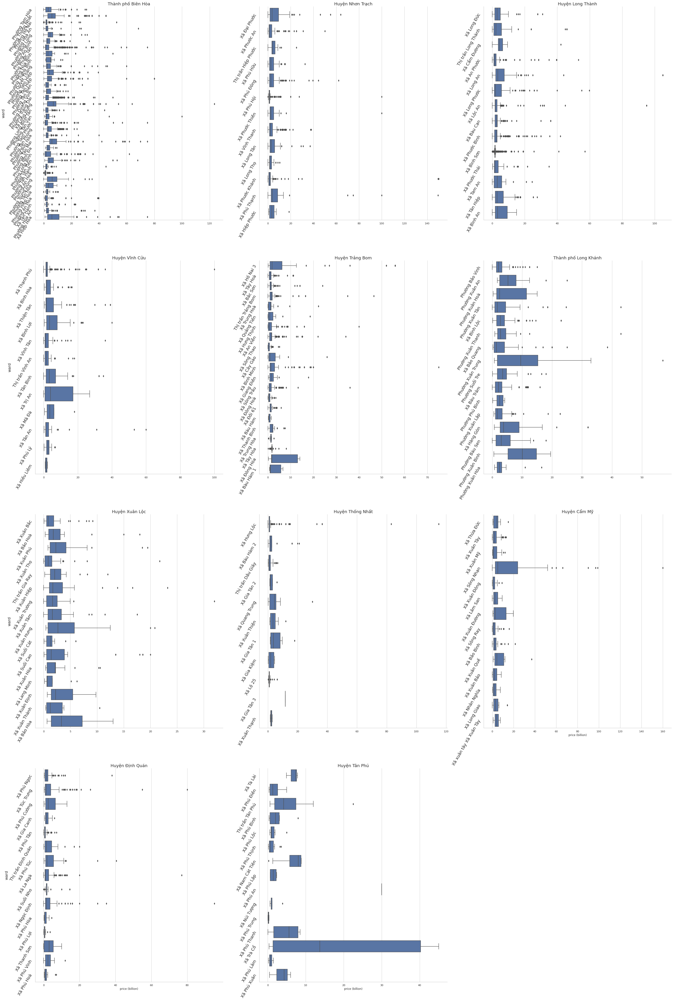

In [185]:
g = sns.FacetGrid(BDS_df9[BDS_df9['region'] == 'Đồng Nai'], col='area', sharey=False,
                  sharex=False, height=15, aspect=0.9, col_wrap=3)

g.map(sns.boxplot, 'price (billion)', 'ward', orient='h')
g.set_titles("{col_name}", size=18)
# g.fig.suptitle('Giá bất động sản tại các tỉnh')

# g.set_xticklabels(fontsize=18)
g.set_yticklabels(rotation=60, fontsize=18)
g.set_ylabels(fontsize=16)


g.fig.tight_layout()
plt.show()


In [186]:
region_cols = ['ward', 'area', 'region', 'price (billion)']
region_ = BDS_df9[region_cols].groupby(
    region_cols[1:-1], as_index=False).mean().sort_values(axis=0, by=['price (billion)'], ignore_index=True)

region_


,area,region,price (billion)
0,Huyện Bàu Bàng,Bình Dương,1.794188
1,Huyện Dầu Tiếng,Bình Dương,1.916759
2,Huyện Trảng Bom,Đồng Nai,2.174994
3,Huyện Phú Giáo,Bình Dương,2.418517
4,Thị xã Bến Cát,Bình Dương,2.730454
5,Huyện Xuân Lộc,Đồng Nai,2.873365
6,Huyện Thống Nhất,Đồng Nai,2.949698
7,Huyện Định Quán,Đồng Nai,3.108261
8,Huyện Bình Chánh,Hồ Chí Minh,3.215234
9,Thành phố Dĩ An,Bình Dương,3.781436


### **list time**


In [187]:
BDS_df9['list_time'] = pd.to_datetime(BDS_df9['list_time'])

BDS_df9['year'] = BDS_df9['list_time'].dt.year
BDS_df9['month'] = BDS_df9['list_time'].dt.month

<Figure size 3600x1440 with 0 Axes>

<AxesSubplot:xlabel='list_time', ylabel='price (billion)'>

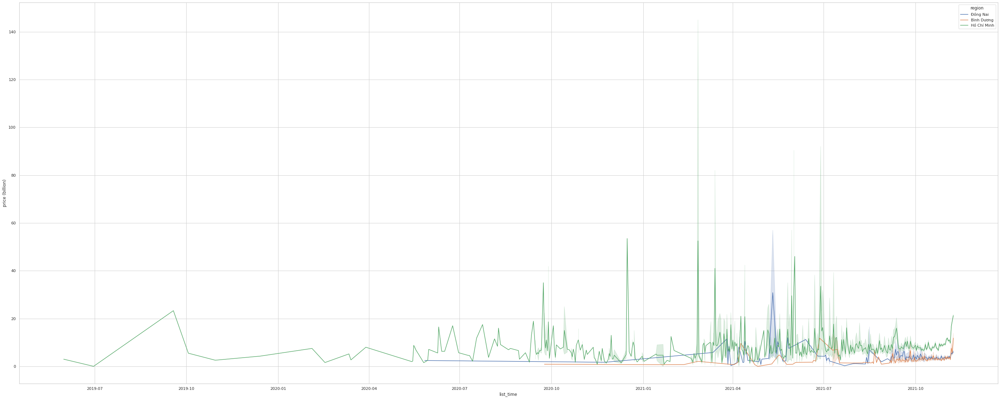

In [188]:
plt.figure(figsize=(50, 20))
sns.lineplot(data=BDS_df9, x="list_time",
             y="price (billion)", hue="region", dashes=False)


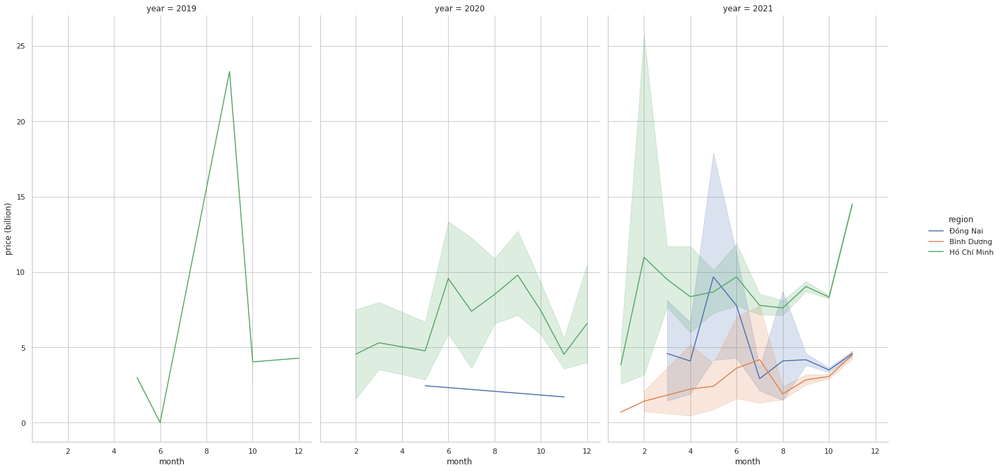

In [189]:
grid = sns.FacetGrid(BDS_df9, hue="region", col="year",
                     margin_titles=True, height=10, aspect=0.65)
grid.map(sns.lineplot, "month", "price (billion)")
grid.add_legend()


In [190]:
BDS_df10['list_time'] = pd.to_datetime(BDS_df10['list_time'])

BDS_df10['year'] = BDS_df10['list_time'].dt.year
BDS_df10['month'] = BDS_df10['list_time'].dt.month

<Figure size 3600x1440 with 0 Axes>

<AxesSubplot:xlabel='list_time', ylabel='price (billion)'>

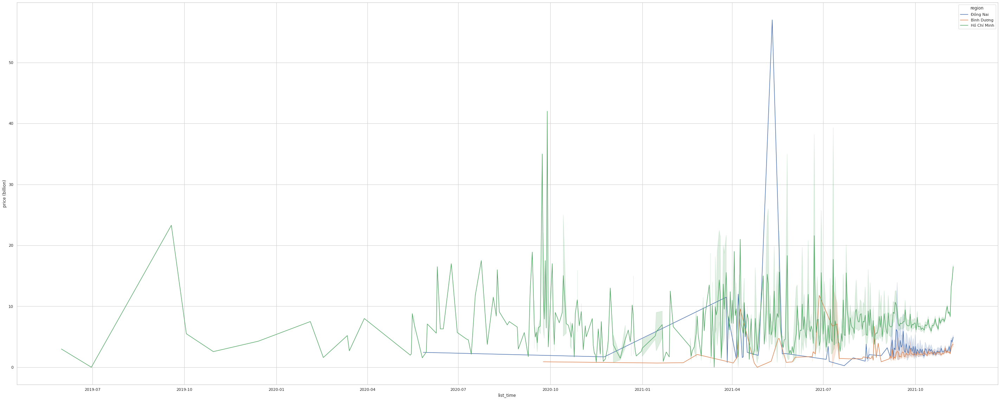

In [191]:
plt.figure(figsize=(50, 20))
sns.lineplot(data=BDS_df10, x="list_time",
             y="price (billion)", hue="region", dashes=False)


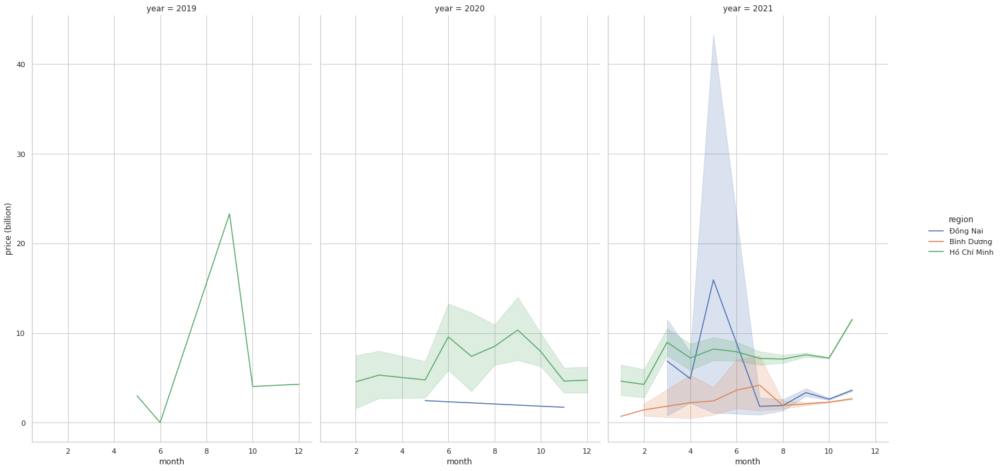

In [192]:
grid = sns.FacetGrid(BDS_df10, hue="region", col="year",
                     margin_titles=True, height=10, aspect=0.65)
grid.map(sns.lineplot, "month", "price (billion)")
grid.add_legend()

### direction , **property_legal_document , rooms , toilets , floors , type_real_estate**


<AxesSubplot:xlabel='price (billion)', ylabel='direction'>

<AxesSubplot:xlabel='price (billion)', ylabel='property_legal_document'>

<AxesSubplot:xlabel='price (billion)', ylabel='rooms'>

<AxesSubplot:xlabel='price (billion)', ylabel='toilets'>

<AxesSubplot:xlabel='price (billion)', ylabel='floors'>

<AxesSubplot:xlabel='price (billion)', ylabel='type_real_estate'>

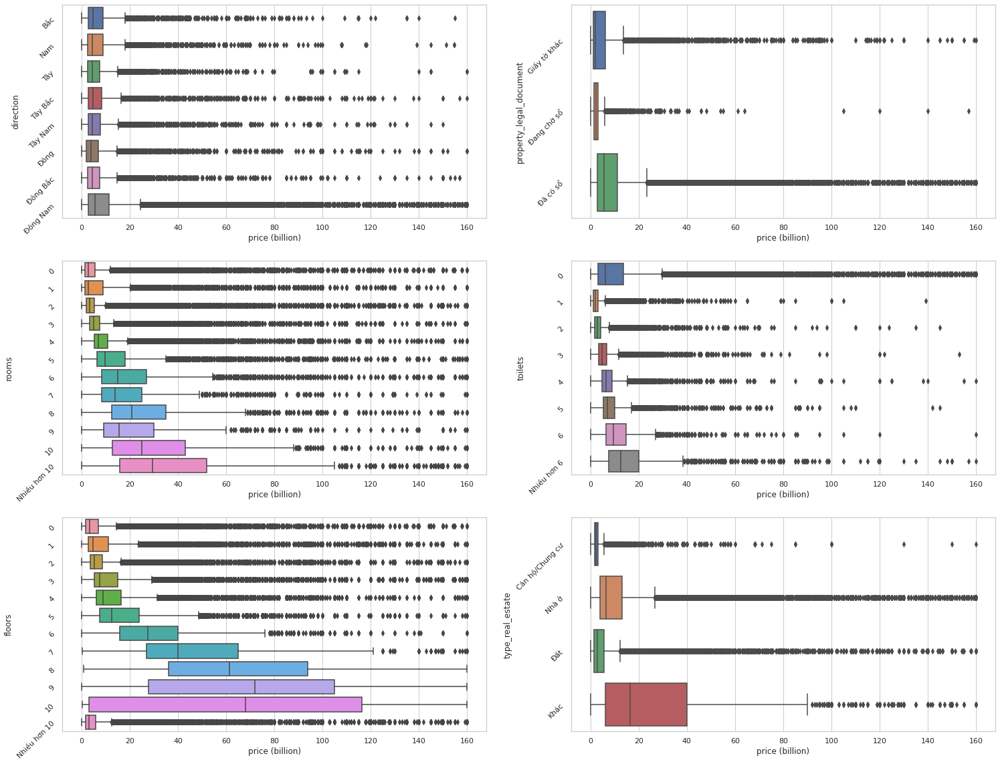

In [210]:
fig, axes = plt.subplots(3, 2, figsize=(25, 20))
col, row = 0, 0
for val in ['direction', 'property_legal_document', 'rooms', 'toilets', 'floors', 'type_real_estate']:
    sns.boxplot(y=val, x='price (billion)', orient='h',
                data=BDS_df9, ax=axes[row, col])
    axes[row, col].tick_params(labelrotation=45, axis='y')
    col += 1
    if col > 1:
        col = 0
        row += 1


<AxesSubplot:xlabel='price (billion)', ylabel='direction'>

<AxesSubplot:xlabel='price (billion)', ylabel='property_legal_document'>

<AxesSubplot:xlabel='price (billion)', ylabel='rooms'>

<AxesSubplot:xlabel='price (billion)', ylabel='toilets'>

<AxesSubplot:xlabel='price (billion)', ylabel='floors'>

<AxesSubplot:xlabel='price (billion)', ylabel='type_real_estate'>

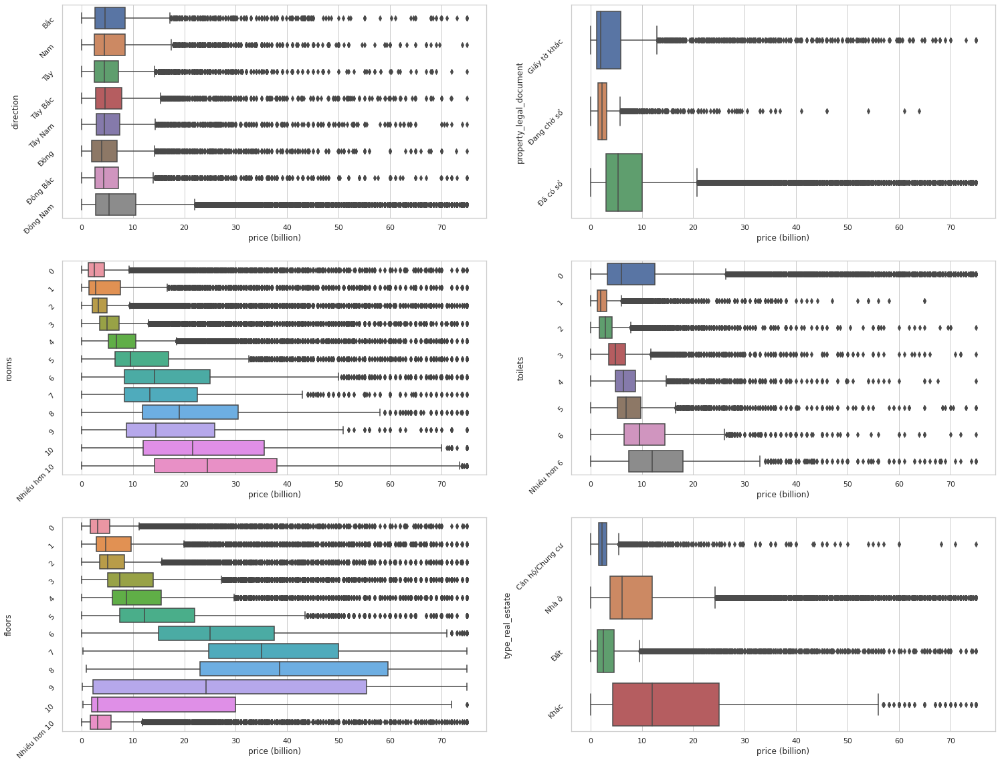

In [211]:
fig, axes = plt.subplots(3, 2, figsize=(25, 20))
col, row = 0, 0
for val in ['direction', 'property_legal_document', 'rooms', 'toilets', 'floors', 'type_real_estate']:
    sns.boxplot(y=val, x='price (billion)', orient='h',
                data=BDS_df10, ax=axes[row, col])
    axes[row, col].tick_params(labelrotation=45, axis='y')
    col += 1
    if col > 1:
        col = 0
        row += 1

In [212]:
type_real_estate = BDS_df9['type_real_estate'].value_counts()
type_real_estate

Nhà ở              147726
Đất                 44729
Căn hộ/Chung cư     15237
Khác                 2484
Name: type_real_estate, dtype: int64

=> Chỉ có direction không có sự khác biệt giữa các nhóm nên cần kết hợp với các thuộc tính khác


<AxesSubplot:xlabel='price (billion)', ylabel='direction'>

<AxesSubplot:xlabel='price (billion)', ylabel='property_legal_document'>

<AxesSubplot:xlabel='price (billion)', ylabel='rooms'>

<AxesSubplot:xlabel='price (billion)', ylabel='toilets'>

<AxesSubplot:xlabel='price (billion)', ylabel='floors'>

<AxesSubplot:xlabel='price (billion)', ylabel='type_real_estate'>

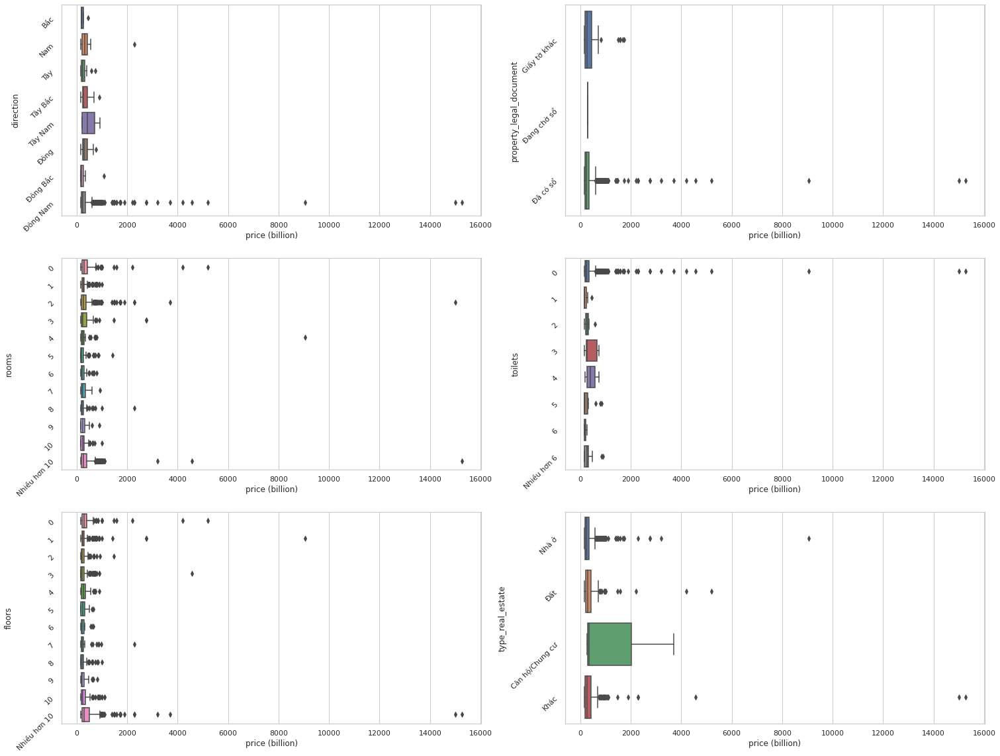

In [213]:
fig, axes = plt.subplots(3, 2, figsize=(25, 20))
col, row = 0, 0
for val in ['direction', 'property_legal_document', 'rooms', 'toilets', 'floors', 'type_real_estate']:
    sns.boxplot(y=val, x='price (billion)', orient='h',
                data=outlier_df, ax=axes[row, col])  # [outlier_df['price (million)'] <0.25e12]
    axes[row, col].tick_params(labelrotation=45, axis='y')
    col += 1
    if col > 1:
        col = 0
        row += 1


In [214]:
# Vì website chỉ là nền tảng đăng tin nên không được tính là yếu tố ảnh hưởng đến giá
BDS_df9.drop('website', axis=1, inplace=True)


## Kết hợp


#### living_size (m2) + type_real_estate


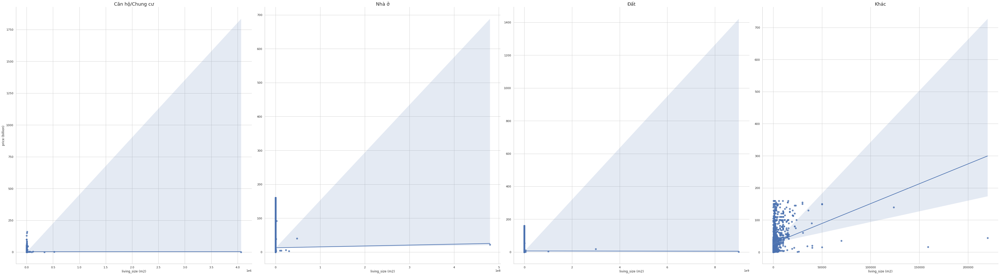

In [215]:
g = sns.FacetGrid(BDS_df9, col='type_real_estate', sharey=False,
                  sharex=False, height=15, aspect=0.9, col_wrap=4)

g.map(sns.regplot, 'living_size (m2)', 'price (billion)')
g.set_titles("{col_name}", size=18)
# g.fig.suptitle('Giá bất động sản tại các tỉnh')

# g.set_yticklabels(rotation=60, fontsize=18)

g.fig.tight_layout()
plt.show()


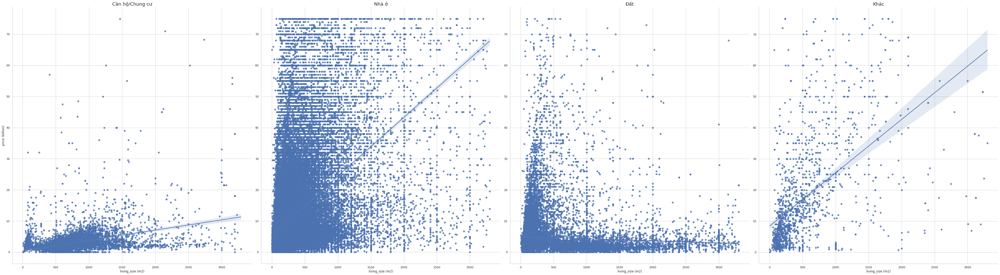

In [216]:
g = sns.FacetGrid(BDS_df10, col='type_real_estate', sharey=False,
                  sharex=False, height=15, aspect=0.9, col_wrap=4)

g.map(sns.regplot, 'living_size (m2)', 'price (billion)')
g.set_titles("{col_name}", size=18)
# g.fig.suptitle('Giá bất động sản tại các tỉnh')

# g.set_yticklabels(rotation=60, fontsize=18)

g.fig.tight_layout()
plt.show()


<Figure size 1440x720 with 0 Axes>

<AxesSubplot:xlabel='living_size (m2)', ylabel='price (billion)'>

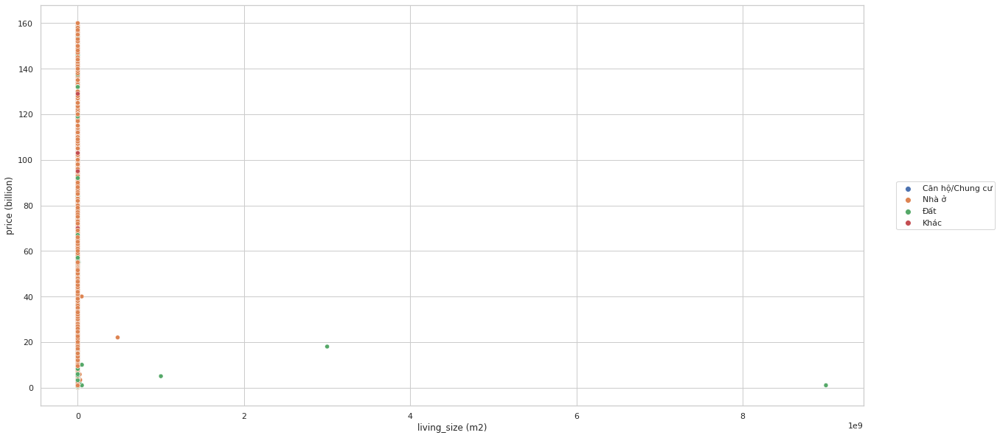

In [217]:
plt.figure(figsize=(20, 10))
sns.scatterplot(data=BDS_df9, x='living_size (m2)',
                y='price (billion)', hue='type_real_estate')
plt.legend(bbox_to_anchor=(1.04, 0.5), loc="center left", borderaxespad=0)


<Figure size 1440x720 with 0 Axes>

<AxesSubplot:xlabel='living_size (m2)', ylabel='price (billion)'>

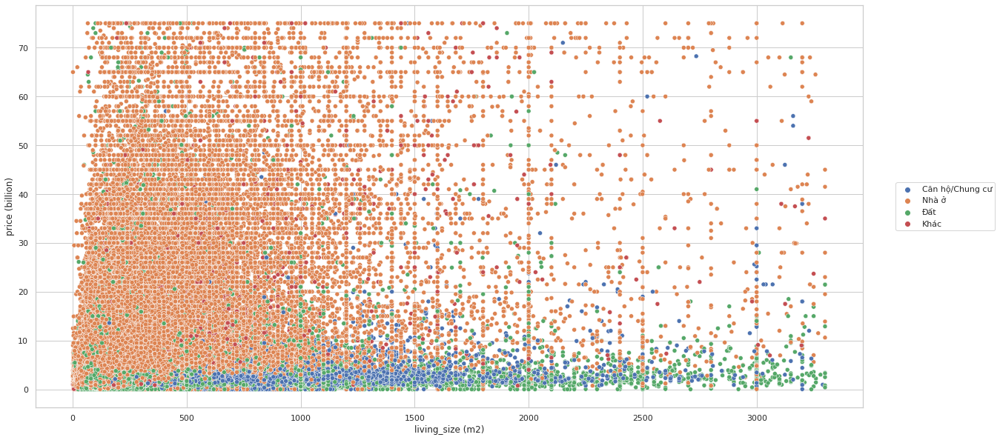

In [218]:
plt.figure(figsize=(20, 10))
sns.scatterplot(data=BDS_df10, x='living_size (m2)',
                y='price (billion)', hue='type_real_estate')
plt.legend(bbox_to_anchor=(1.04, 0.5), loc="center left", borderaxespad=0)


#### size (m2) + type_real_estate


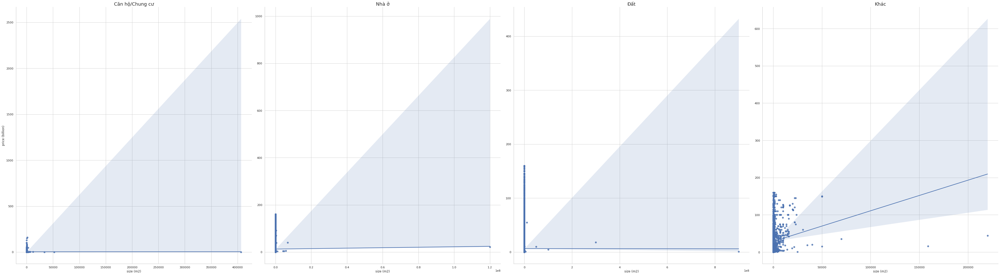

In [219]:
g = sns.FacetGrid(BDS_df9, col='type_real_estate', sharey=False,
                  sharex=False, height=15, aspect=0.9, col_wrap=4)

g.map(sns.regplot, 'size (m2)', 'price (billion)')
g.set_titles("{col_name}", size=18)
# g.fig.suptitle('Giá bất động sản tại các tỉnh')

# g.set_yticklabels(rotation=60, fontsize=18)

g.fig.tight_layout()
plt.show()


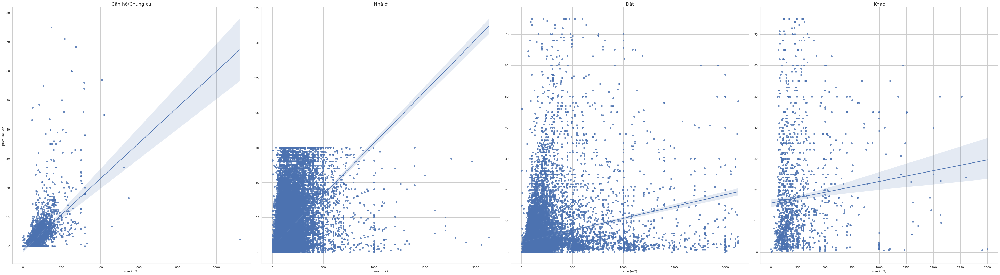

In [220]:
g = sns.FacetGrid(BDS_df10, col='type_real_estate', sharey=False,
                  sharex=False, height=15, aspect=0.9, col_wrap=4)

g.map(sns.regplot, 'size (m2)', 'price (billion)')
g.set_titles("{col_name}", size=18)
# g.fig.suptitle('Giá bất động sản tại các tỉnh')

# g.set_yticklabels(rotation=60, fontsize=18)

g.fig.tight_layout()
plt.show()


<Figure size 1440x720 with 0 Axes>

<AxesSubplot:xlabel='size (m2)', ylabel='price (billion)'>

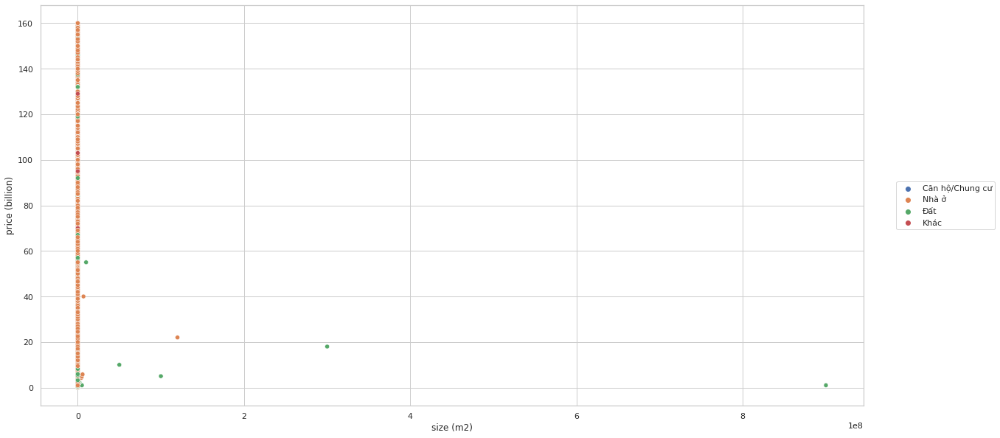

In [221]:
plt.figure(figsize=(20, 10))
sns.scatterplot(data=BDS_df9, x='size (m2)',
                y='price (billion)', hue='type_real_estate')
plt.legend(bbox_to_anchor=(1.04, 0.5), loc="center left", borderaxespad=0)


<Figure size 1440x720 with 0 Axes>

<AxesSubplot:xlabel='size (m2)', ylabel='price (billion)'>

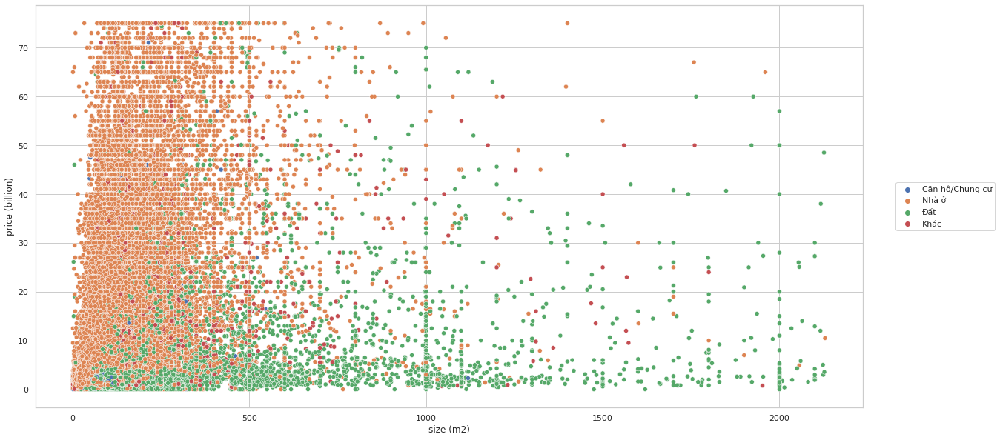

In [222]:
plt.figure(figsize=(20, 10))
sns.scatterplot(data=BDS_df10, x='size (m2)',
                y='price (billion)', hue='type_real_estate')
plt.legend(bbox_to_anchor=(1.04, 0.5), loc="center left", borderaxespad=0)


#### length (m) + type_real_estate


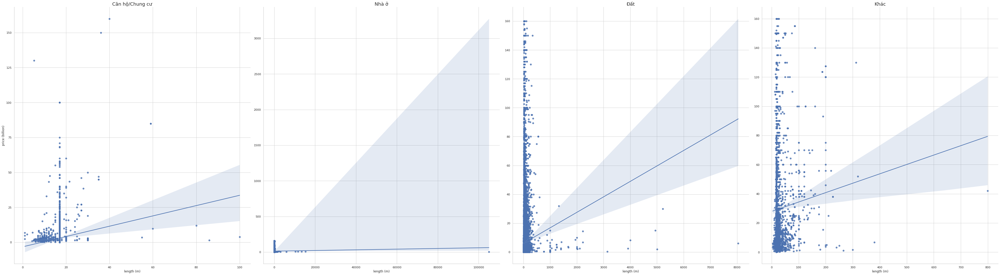

In [453]:
g = sns.FacetGrid(BDS_df9, col='type_real_estate', sharey=False,
                  sharex=False, height=15, aspect=0.9, col_wrap=4)

g.map(sns.regplot, 'length (m)', 'price (billion)')
g.set_titles("{col_name}", size=18)
# g.fig.suptitle('Giá bất động sản tại các tỉnh')

# g.set_ticklabels( fontsize=18)

g.fig.tight_layout()
plt.show()


<Figure size 1440x720 with 0 Axes>

<AxesSubplot:xlabel='length (m)', ylabel='price (billion)'>

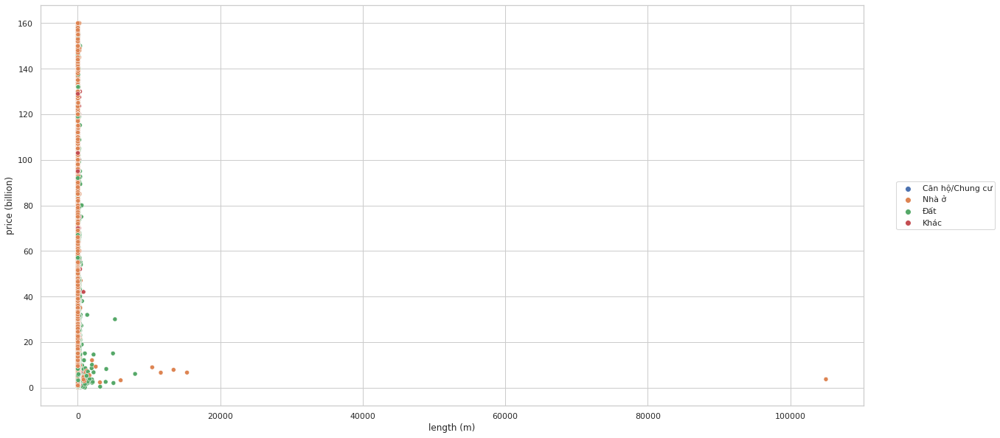

In [454]:
plt.figure(figsize=(20, 10))
sns.scatterplot(data=BDS_df9, x='length (m)',
                y='price (billion)', hue='type_real_estate')
plt.legend(bbox_to_anchor=(1.04, 0.5), loc="center left", borderaxespad=0)


#### width (m) + type_real_estate


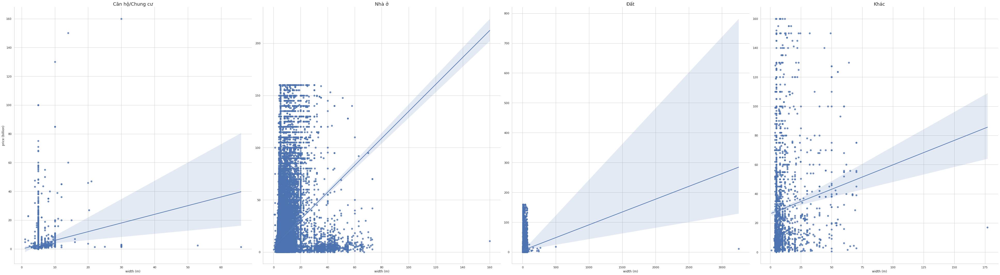

In [455]:
g = sns.FacetGrid(BDS_df9, col='type_real_estate', sharey=False,
                  sharex=False, height=15, aspect=0.9, col_wrap=4)

g.map(sns.regplot, 'width (m)', 'price (billion)')
g.set_titles("{col_name}", size=18)
# g.fig.suptitle('Giá bất động sản tại các tỉnh')

# g.set_ticklabels( fontsize=18)

g.fig.tight_layout()
plt.show()


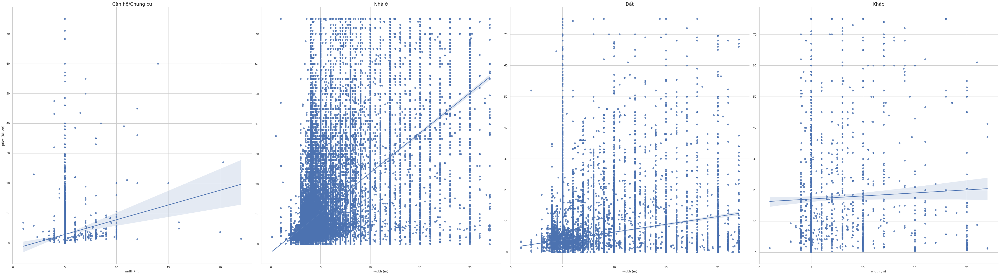

In [223]:
g = sns.FacetGrid(BDS_df10, col='type_real_estate', sharey=False,
                  sharex=False, height=15, aspect=0.9, col_wrap=4)

g.map(sns.regplot, 'width (m)', 'price (billion)')
g.set_titles("{col_name}", size=18)
# g.fig.suptitle('Giá bất động sản tại các tỉnh')

# g.set_ticklabels( fontsize=18)

g.fig.tight_layout()
plt.show()


<Figure size 1440x720 with 0 Axes>

<AxesSubplot:xlabel='width (m)', ylabel='price (billion)'>

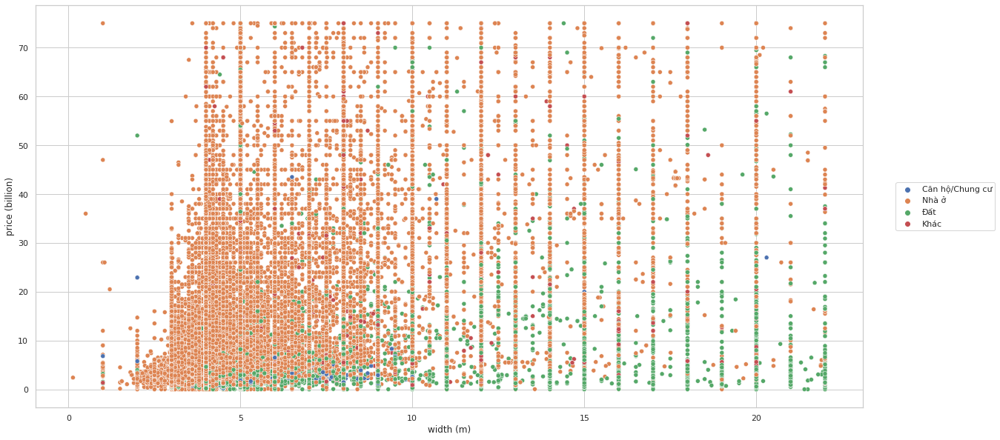

In [224]:
plt.figure(figsize=(20, 10))
sns.scatterplot(data=BDS_df10, x='width (m)',
                y='price (billion)', hue='type_real_estate')
plt.legend(bbox_to_anchor=(1.04, 0.5), loc="center left", borderaxespad=0)


<Figure size 1440x720 with 0 Axes>

<AxesSubplot:xlabel='width (m)', ylabel='price (billion)'>

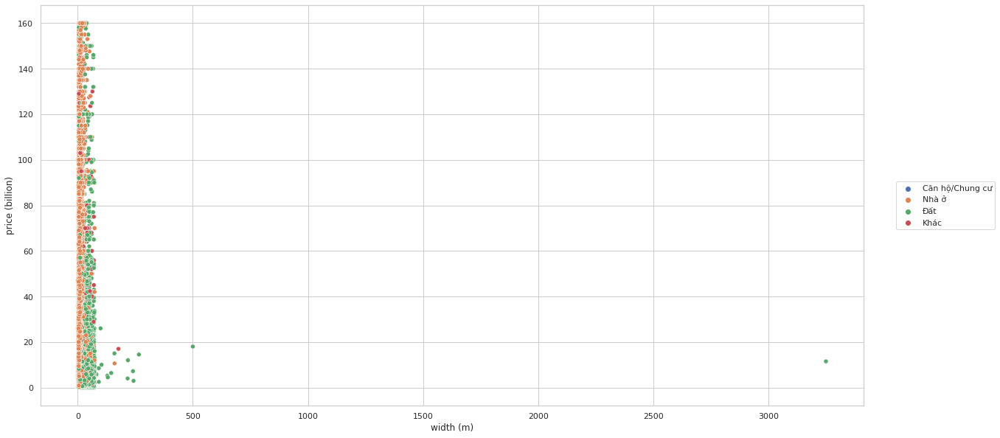

In [456]:
plt.figure(figsize=(20, 10))
sns.scatterplot(data=BDS_df9, x='width (m)',
                y='price (billion)', hue='type_real_estate')
plt.legend(bbox_to_anchor=(1.04, 0.5), loc="center left", borderaxespad=0)


#### cate vs cate

<AxesSubplot:xlabel='type_real_estate', ylabel='price (billion)'>

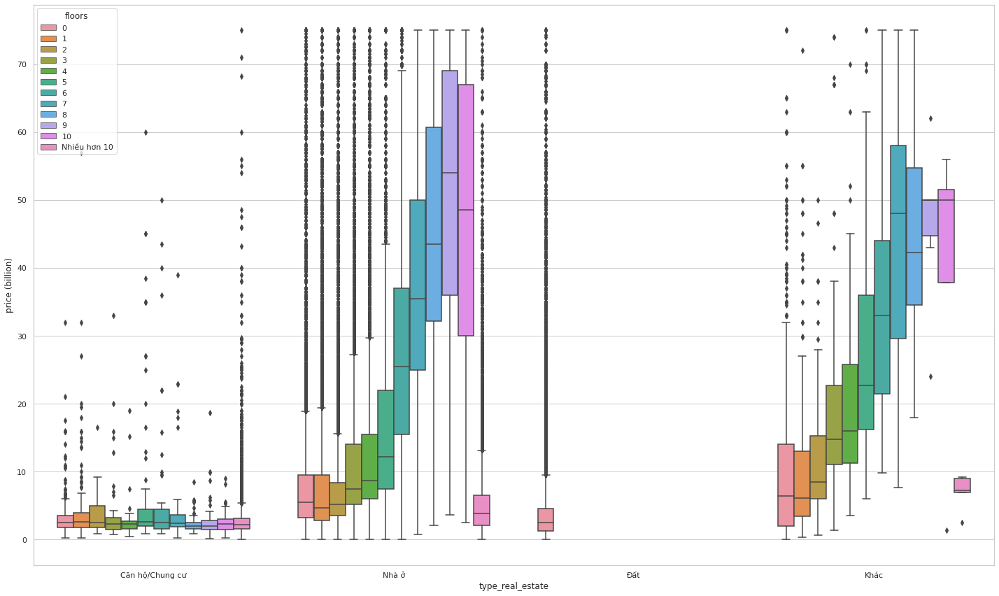

In [193]:
plt.rcParams["figure.figsize"] = [20.00, 12.0]
plt.rcParams["figure.autolayout"] = True
sns.boxplot(x=BDS_df10['type_real_estate'], y=BDS_df10['price (billion)'], hue=BDS_df10['floors'])

plt.show()

<AxesSubplot:xlabel='type_real_estate', ylabel='price (billion)'>

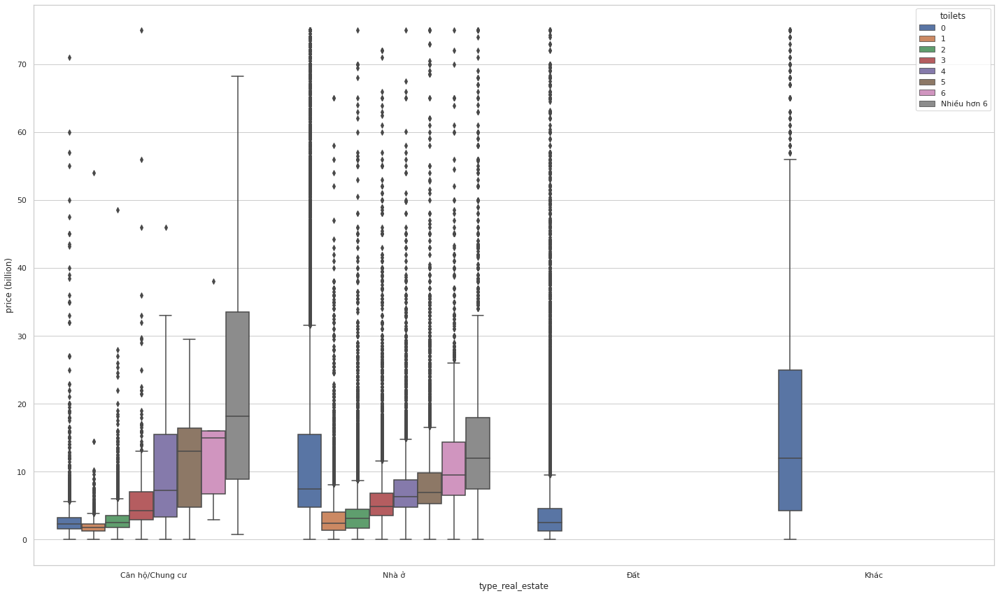

In [194]:
plt.rcParams["figure.figsize"] = [20.00, 12.0]
plt.rcParams["figure.autolayout"] = True
sns.boxplot(x=BDS_df10['type_real_estate'], y=BDS_df10['price (billion)'], hue=BDS_df10['toilets'])

plt.show()